In [43]:
import os
import sys
import math
import numpy as np

from scipy    import stats
from datetime import datetime

import matplotlib.pyplot as plt

from scipy.optimize import curve_fit

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('/Users/romoluque_c/Repositories/BACON_romo/')
sys.path.append(repository_path)

import peak_functions as pf
import fit_functions  as fitf

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 13

In [5]:
evts_path = '/Users/romoluque_c/LEGEND/BACON/data_npz/'

all_channels = 9

peak_heigh_all_channels_dict   = {}
peak_area_all_channels_dict    = {}
peak_area_zs_all_channels_dict = {}

def get_date(filename):
    date_str = filename[31:41]
    date = datetime.strptime(date_str, '%m_%d_%Y')
    return date

files        = os.listdir(evts_path)
filt_files   = [file for file in files if file.startswith("bacon_peak_height_and_area")]
sorted_files = sorted(filt_files, key=get_date)

for filename in sorted_files:
    my_file = evts_path+filename
    d = np.load(my_file, allow_pickle=True)
    
    date = filename[31:41]
    
    if date not in peak_heigh_all_channels_dict:
        peak_heigh_all_channels   = [np.array([]) for _ in range(all_channels)]
        peak_area_all_channels    = [np.array([]) for _ in range(all_channels)]
        peak_area_zs_all_channels = [np.array([]) for _ in range(all_channels)]

    for channel in range(all_channels):
        if channel==3:
            continue
        if len(d['peak_heigh_all_channels'])<8:
            if channel==7:
                continue
            elif channel>7:
                peak_heigh_all_channels  [channel] = np.concatenate((peak_heigh_all_channels  [channel], d['peak_heigh_all_channels']  [channel-2]))
                peak_area_all_channels   [channel] = np.concatenate((peak_area_all_channels   [channel], d['peak_area_all_channels']   [channel-2]))
                peak_area_zs_all_channels[channel] = np.concatenate((peak_area_zs_all_channels[channel], d['peak_area_zs_all_channels'][channel-2]))
                continue
        if channel > 3:
            peak_heigh_all_channels  [channel] = np.concatenate((peak_heigh_all_channels  [channel], d['peak_heigh_all_channels']  [channel-1]))
            peak_area_all_channels   [channel] = np.concatenate((peak_area_all_channels   [channel], d['peak_area_all_channels']   [channel-1]))
            peak_area_zs_all_channels[channel] = np.concatenate((peak_area_zs_all_channels[channel], d['peak_area_zs_all_channels'][channel-1]))
        else:
            peak_heigh_all_channels  [channel] = np.concatenate((peak_heigh_all_channels  [channel], d['peak_heigh_all_channels']  [channel]))
            peak_area_all_channels   [channel] = np.concatenate((peak_area_all_channels   [channel], d['peak_area_all_channels']   [channel]))
            peak_area_zs_all_channels[channel] = np.concatenate((peak_area_zs_all_channels[channel], d['peak_area_zs_all_channels'][channel]))

    peak_heigh_all_channels_dict  [filename[31:41]] = np.array(peak_heigh_all_channels  , dtype=object)
    peak_area_all_channels_dict   [filename[31:41]] = np.array(peak_area_all_channels   , dtype=object)
    peak_area_zs_all_channels_dict[filename[31:41]] = np.array(peak_area_zs_all_channels, dtype=object)

### Using the height of the pulses

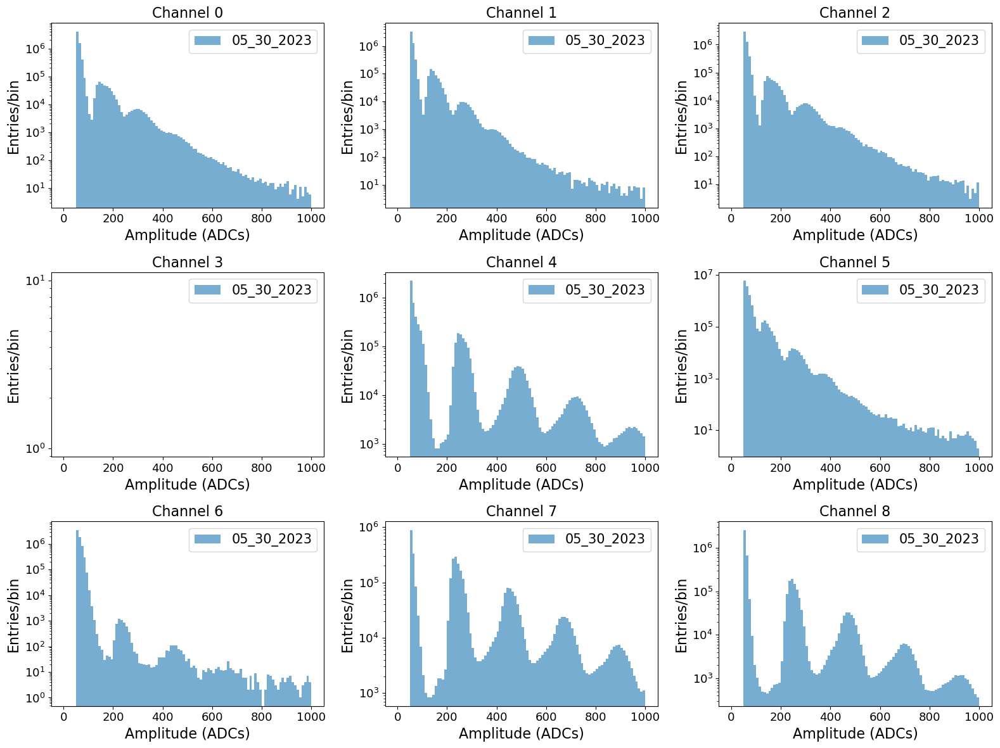

In [6]:
select_date = '05_30_2023'

fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in range(9):
    i = int(k/3)
    j = k%3
    axs[i][j].hist(peak_heigh_all_channels_dict[select_date][k], bins=100, range=(0,1000), log=True, label=f'{select_date}', alpha=0.6)
    axs[i][j].set_xlabel('Amplitude (ADCs)', fontsize=16)
    axs[i][j].set_ylabel('Entries/bin',      fontsize=16)
    axs[i][j].set_title(f"Channel {k}",      fontsize=16)
    axs[i][j].legend(fontsize=15)
plt.tight_layout()
plt.show()

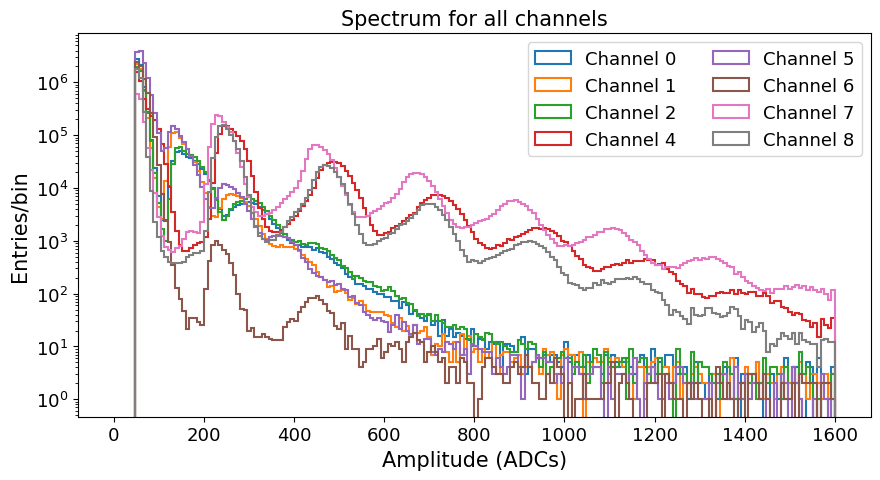

In [7]:
select_date = '05_30_2023'

plt.figure(figsize=(9, 5))
for channel in range(9):
    if channel == 3: continue
    plt.hist(peak_heigh_all_channels_dict[select_date][channel], bins=200, range=(0,1600), log=True, histtype='step', linewidth=1.5, label=f'Channel {channel}')
plt.xlabel('Amplitude (ADCs)',          fontsize=15)
plt.ylabel('Entries/bin',               fontsize=15)
plt.title(f"Spectrum for all channels", fontsize=15)
plt.tight_layout()
plt.legend(ncol=2)
plt.show()

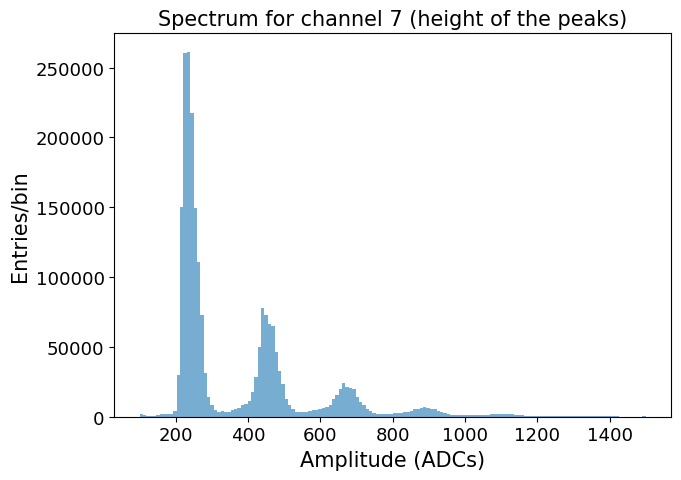

In [45]:
sel_channel = 7
select_date = '05_30_2023'

plt.figure(figsize=(7, 5))
y, x, _ = plt.hist(peak_heigh_all_channels_dict[select_date][sel_channel], bins=150, range=(100,1500), log=False, alpha=0.6)
plt.xlabel('Amplitude (ADCs)',      fontsize=15)
plt.ylabel('Entries/bin',           fontsize=15)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=15)
plt.tight_layout()
plt.show()

In [46]:
# Define the function for a single Gaussian peak
def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-(x - mean)**2 / (2 * stddev**2))

# Define the function for multiple Gaussian peaks
def multi_gaussian(x, *params):
    n_peaks = len(params) // 3
    y = np.zeros_like(x)
    for i in range(n_peaks):
        amplitude = params[i * 3]
        mean = params[i * 3 + 1]
        stddev = params[i * 3 + 2]
        y += gaussian(x, amplitude, mean, stddev)
    return y

def shift_to_bin_centers(x):
    """
    Return bin centers, given bin lower edges.
    """
    return x[:-1] + np.diff(x) * 0.5

def truncate(number, decimals=0):
    """
    Returns a value truncated to a specific number of decimal places.
    """
    if not isinstance(decimals, int):
        raise TypeError("decimal places must be an integer.")
    elif decimals < 0:
        raise ValueError("decimal places has to be 0 or more.")
    elif decimals == 0:
        return math.trunc(number)

    factor = 10.0 ** decimals
    return math.trunc(number * factor) / factor

def plot_linear_fit(y, yerr):
    x    = np.arange(len(y))+1
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    line = slope*x + intercept
    
    fig = plt.figure(figsize=(8,5))
    plt.errorbar(x, y, yerr=yerr, marker='_', markersize=5, linestyle='', c='k', label=f'Measured gain values')
    plt.plot(x, line, color='r', alpha=0.7, label=f'Fit: y = x*{round(slope, 2)} - {round(np.abs(intercept), 2)}, \n     R$^2$ = {truncate(r_value, 2)}')
    
    plt.xlabel('Peak number')
    plt.ylabel('Mu from fit (ADCs)')
    plt.legend(fontsize=14, loc='upper left')
    plt.show()
    return slope

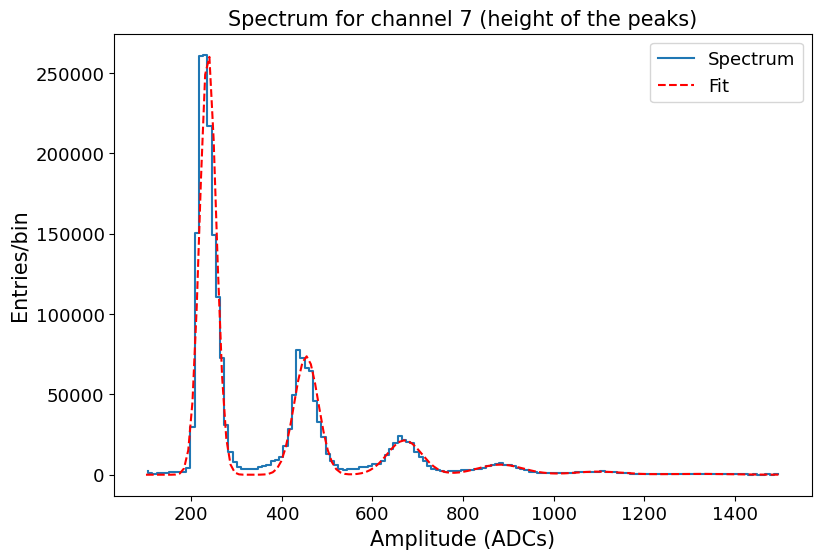

In [47]:
initial_guess = [250000, 235, 20, 60000, 450, 25, 25000, 680, 30, 10000, 900, 40, 5000, 1100, 50, 2000, 1300, 50]  # Initial guess for the parameters
popt, pcov = curve_fit(multi_gaussian, shift_to_bin_centers(x), y, p0=initial_guess)

plt.step(shift_to_bin_centers(x), y, label='Spectrum')
plt.plot(x, multi_gaussian(x, *popt), 'r--', label='Fit')
#plt.xlim(400, 1500)
#plt.ylim(0, 10000)
plt.xlabel('Amplitude (ADCs)',      fontsize=15)
plt.ylabel('Entries/bin',           fontsize=15)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=15)
plt.legend()
plt.show()

In [18]:
print('Fitted Parameters:')
for i in range(len(popt)//3):
    print(f'Peak {i+1}: Amplitude={popt[i*3]:.2f}, Mean={popt[i*3+1]:.2f}, StdDev={popt[i*3+2]:.2f}')

perr = np.sqrt(np.diag(pcov))

# Print the fitted parameters with their errors
print("")
print('Fitted Parameters with Errors:')
for i in range(len(popt)//3):
    print(f'Peak {i+1}: Amplitude={popt[i*3]:.2f} ± {perr[i*3]:.2f}, Mean={popt[i*3+1]:.2f} ± {perr[i*3+1]:.2f}, StdDev={popt[i*3+2]:.2f} ± {perr[i*3+2]:.2f}')

Fitted Parameters:
Peak 1: Amplitude=263993.39, Mean=236.87, StdDev=18.23
Peak 2: Amplitude=73736.62, Mean=454.11, StdDev=26.64
Peak 3: Amplitude=21377.36, Mean=670.83, StdDev=37.95
Peak 4: Amplitude=6263.29, Mean=882.36, StdDev=51.28
Peak 5: Amplitude=1939.19, Mean=1097.90, StdDev=52.75
Peak 6: Amplitude=534.61, Mean=1314.82, StdDev=72.43

Fitted Parameters with Errors:
Peak 1: Amplitude=263993.39 ± 4982.17, Mean=236.87 ± 0.40, StdDev=18.23 ± 0.40
Peak 2: Amplitude=73736.62 ± 4121.65, Mean=454.11 ± 1.72, StdDev=26.64 ± 1.72
Peak 3: Amplitude=21377.36 ± 3460.42, Mean=670.83 ± 7.12, StdDev=37.95 ± 7.19
Peak 4: Amplitude=6263.29 ± 3013.04, Mean=882.36 ± 29.08, StdDev=51.28 ± 30.85
Peak 5: Amplitude=1939.19 ± 2973.38, Mean=1097.90 ± 109.56, StdDev=52.75 ± 120.55
Peak 6: Amplitude=534.61 ± 2578.56, Mean=1314.82 ± 457.22, StdDev=72.43 ± 506.96


In [20]:
perr = np.sqrt(np.diag(pcov))

all_means     = np.array([popt[i*3+1] for i in range(len(popt)//3)])
all_means_err = np.array([perr[i*3+1] for i in range(len(perr)//3)])

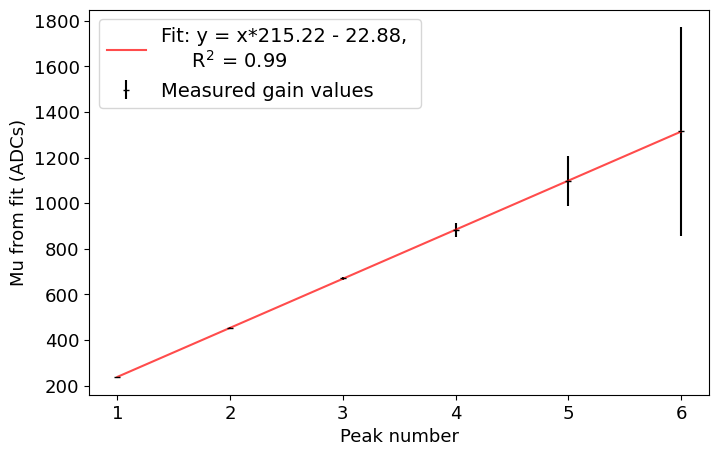

215.21856854674013

In [23]:
plot_linear_fit(all_means, all_means_err)

### Automatize the process:

In [24]:
def fit_spectrum_and_plot(data, channel=7, initial_guess=[1000, 100, 20]):
    
    plt.figure(figsize=(7, 5))
    y, x, _ = plt.hist(data, bins=150, range=(100,1500), log=False, alpha=0.6)

    popt, pcov = curve_fit(multi_gaussian, shift_to_bin_centers(x), y, p0=initial_guess)
    
    plt.plot(x, multi_gaussian(x, *popt), 'r--', label='Fit')
    plt.xlabel('Amplitude (ADCs)',      fontsize=15)
    plt.ylabel('Entries/bin',           fontsize=15)
    plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=15)
    plt.tight_layout()
    plt.show()
    
    perr = np.sqrt(np.diag(pcov))
    
    all_means     = np.array([popt[i*3+1] for i in range(len(popt)//3)])
    all_means_err = np.array([perr[i*3+1] for i in range(len(perr)//3)])
    
    return plot_linear_fit(all_means, all_means_err)

In [30]:
initial_guess7 = [250000, 235, 20, 60000, 450, 25, 25000, 680, 30, 10000, 900, 40, 5000, 1100, 50, 2000, 1300, 50]  # Initial guess for the parameters
initial_guess8 = [50000, 240, 20, 20000, 470, 25, 5000, 700, 30, 1000, 920, 40, 100, 1160, 50]  # Initial guess for the parameters
initial_guess4 = [110000, 260, 20, 20000, 490, 25, 6000, 720, 30, 1500, 940, 40, 500, 1170, 50]  # Initial guess for the parameters
initial_guess2 = [38000, 160, 20, 5000, 300, 25, 600, 440, 30]
initial_guess0 = [38000, 160, 20, 5000, 300, 25, 600, 440, 30]
initial_guess1 = [80000, 150, 20, 6000, 270, 25, 600, 380, 30]
initial_guess5 = [12000, 140, 20, 1000, 250, 25, 100, 370, 30]
initial_guess6 = [1000, 230, 20, 100, 440, 25, 10, 650, 30]

### Channel 7

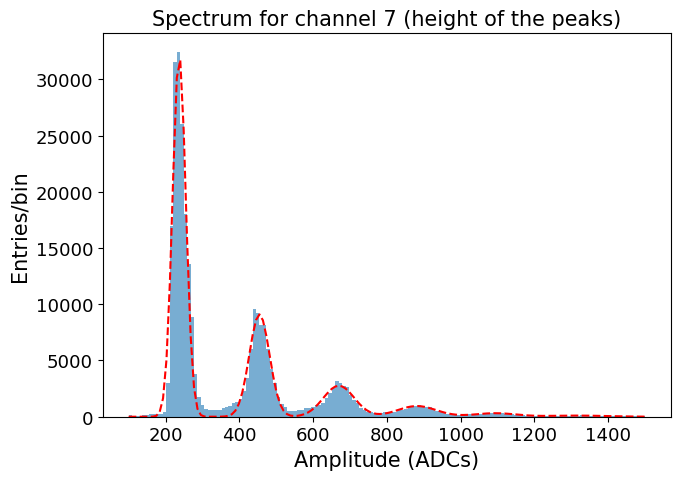

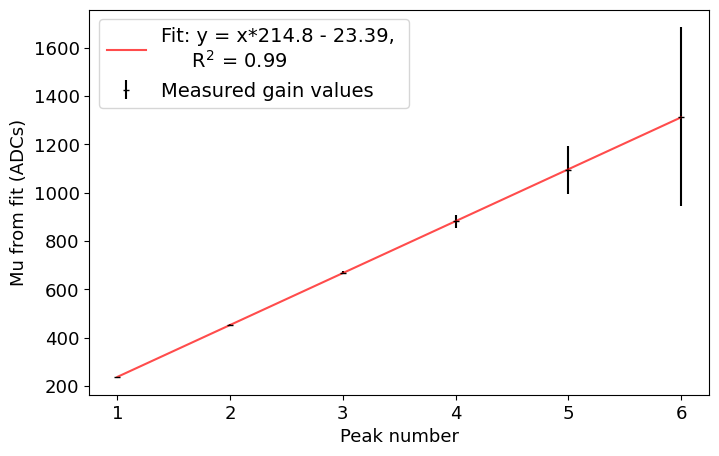

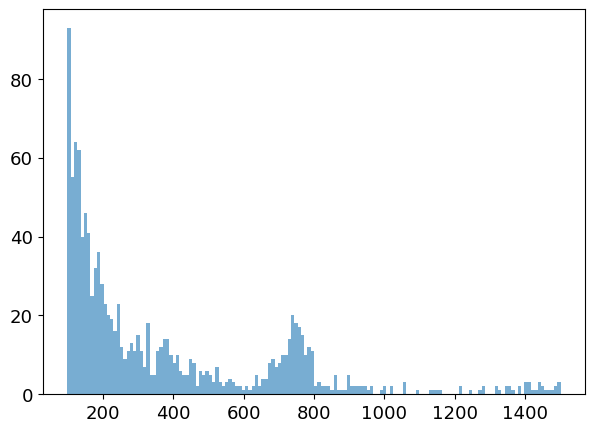

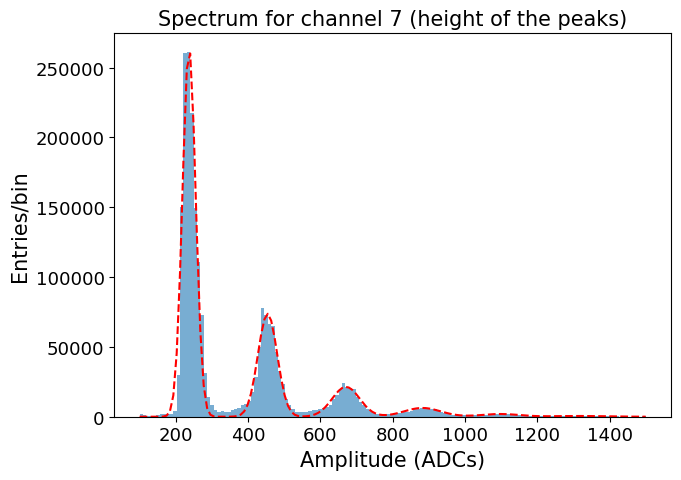

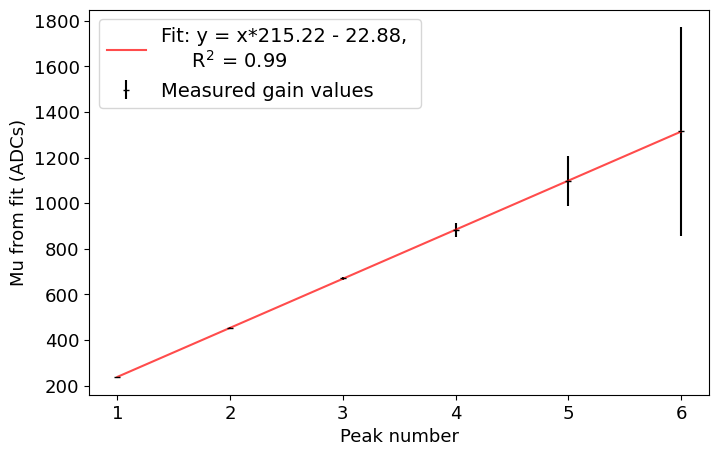

...

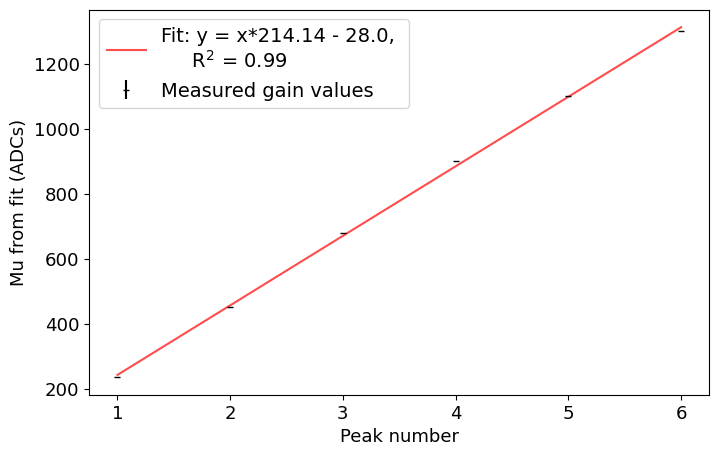

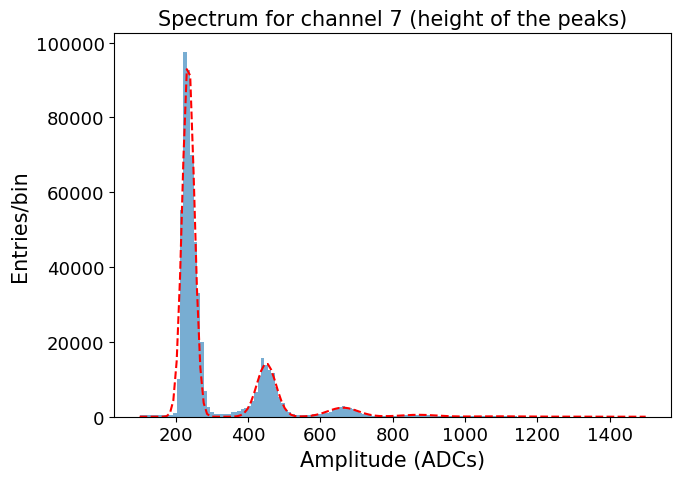

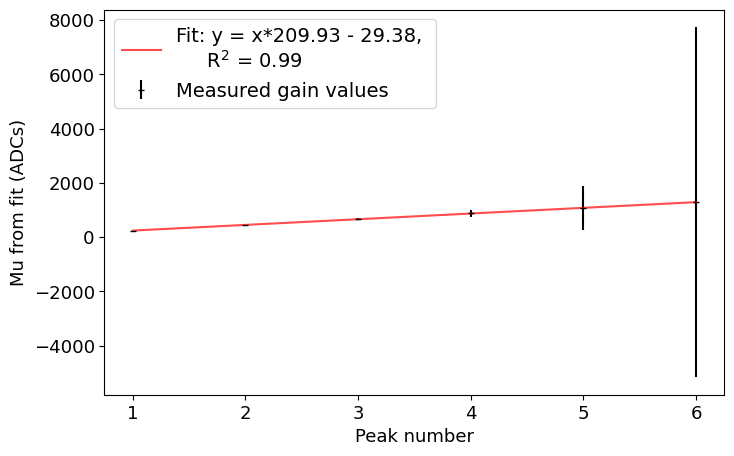

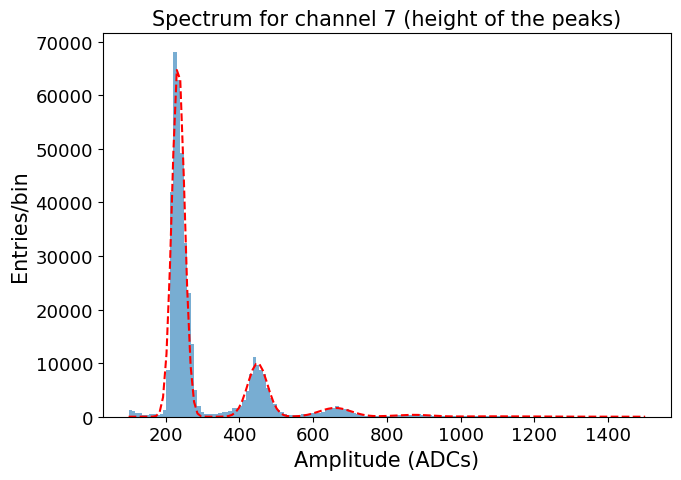

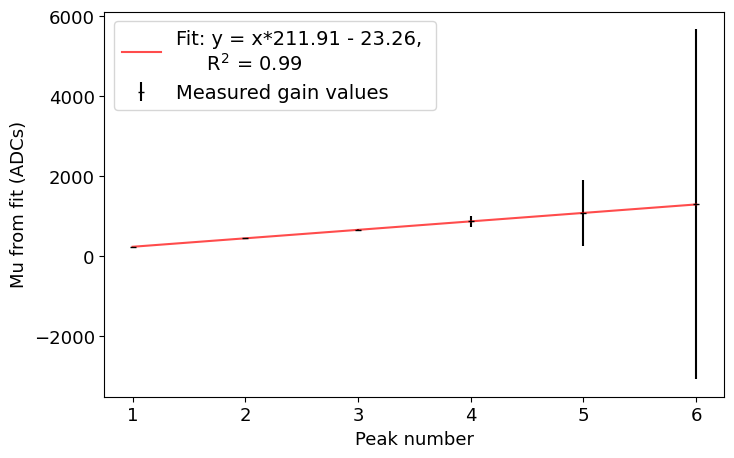

In [26]:
sel_channel = 7

all_slopes = {}
for sel_date in peak_heigh_all_channels_dict.keys():
    try:
        all_slopes[sel_date] = fit_spectrum_and_plot(peak_heigh_all_channels_dict[sel_date][sel_channel], channel=7, initial_guess=initial_guess7)
    except RuntimeError:
        continue

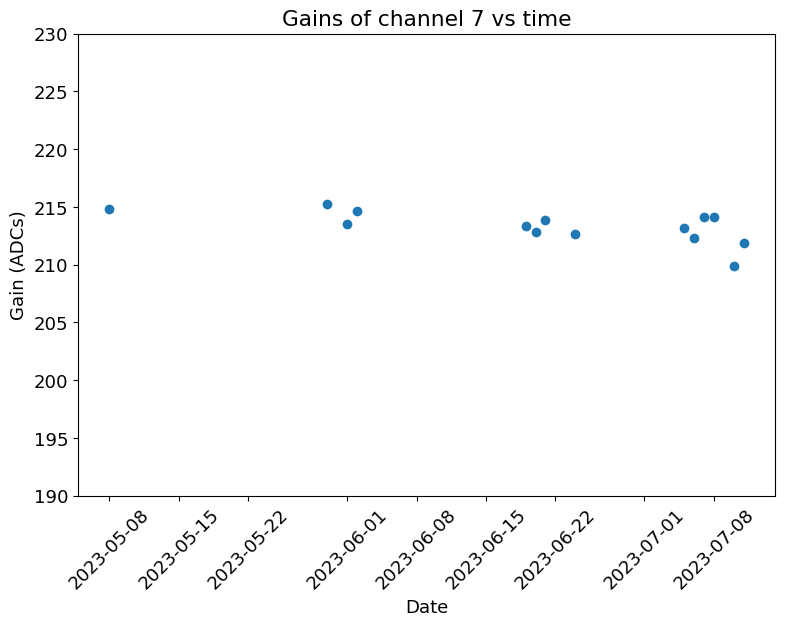

In [27]:
dates = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes.keys()]

plt.scatter(dates, all_slopes.values())
plt.xlabel('Date')
plt.ylabel('Gain (ADCs)')
plt.title('Gains of channel 7 vs time')
plt.xticks(rotation=45)  # Optional: Rotate x-axis labels for better visibility
plt.ylim(190, 230)
plt.show()

### Channel 8

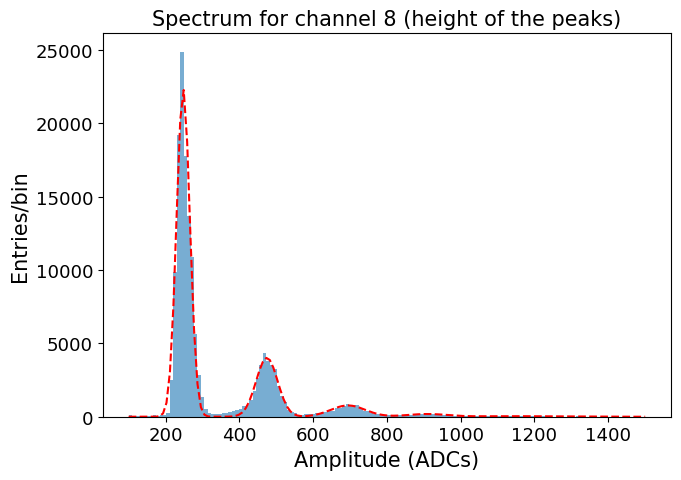

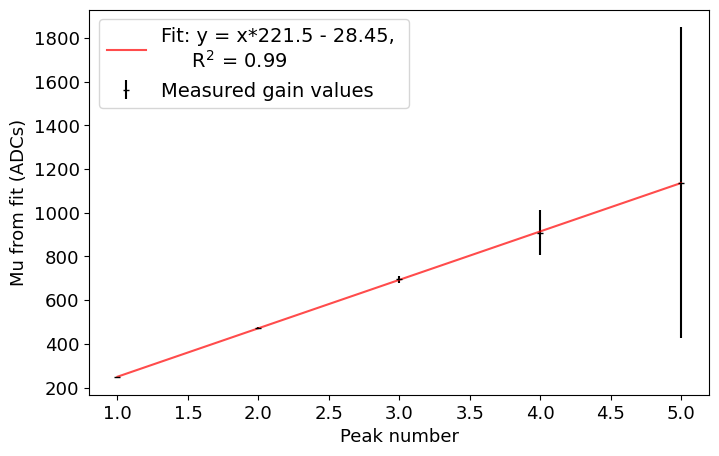

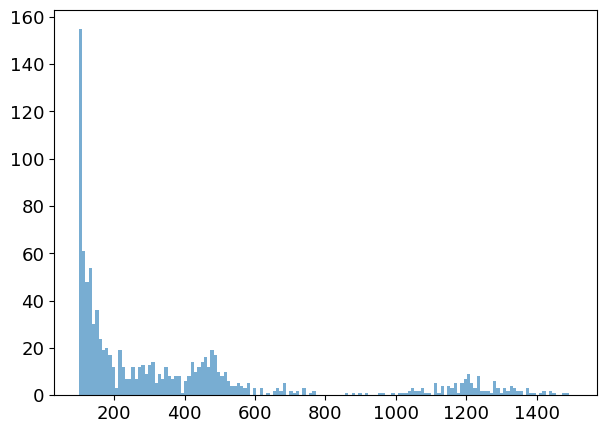

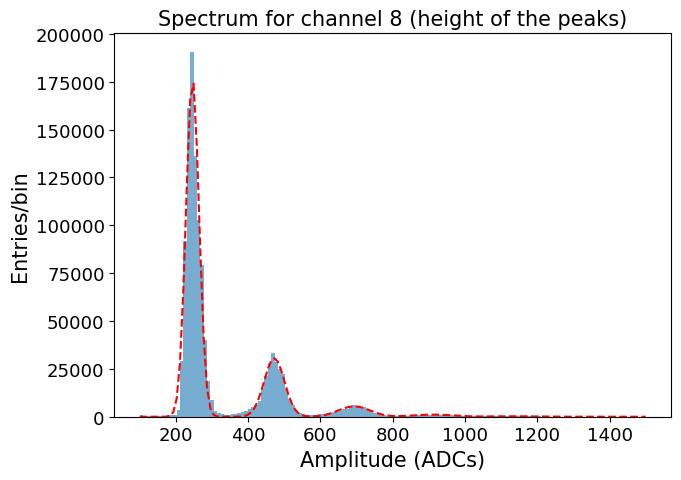

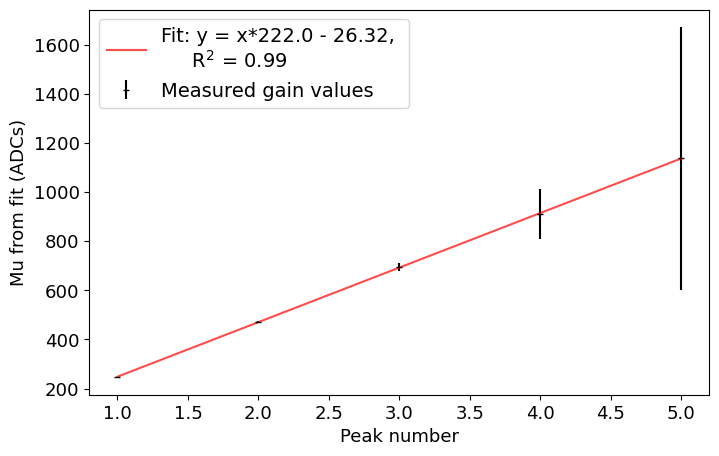

...

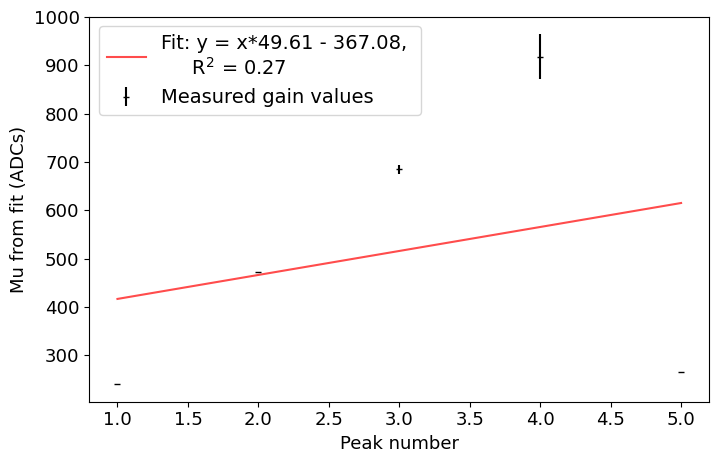

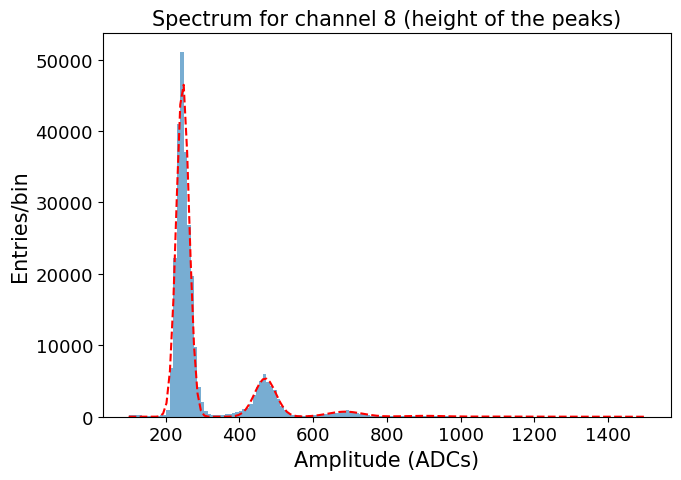

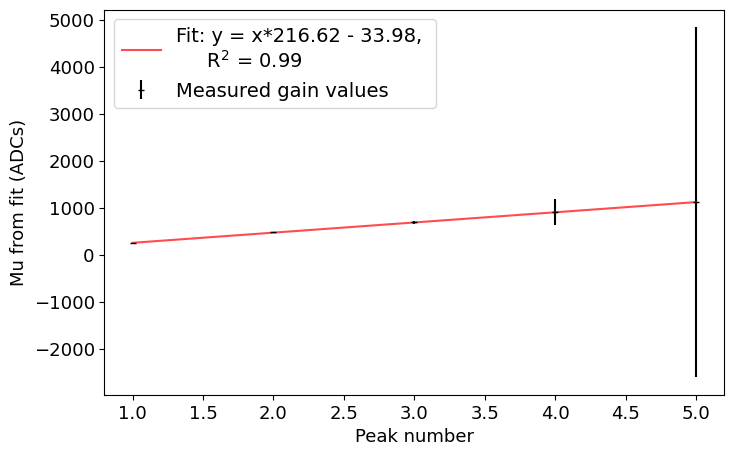

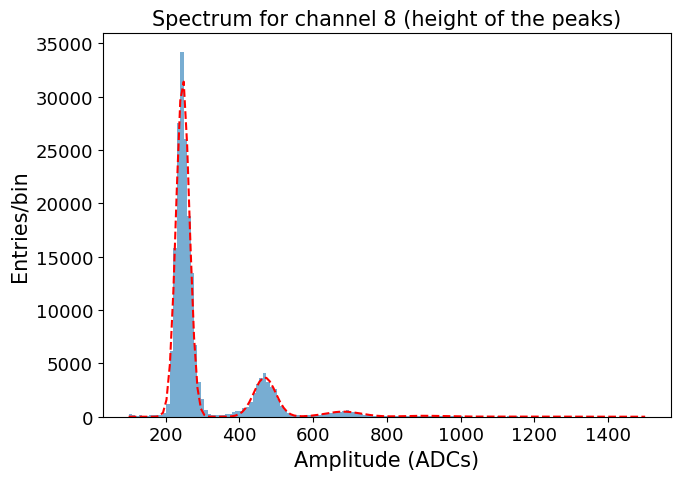

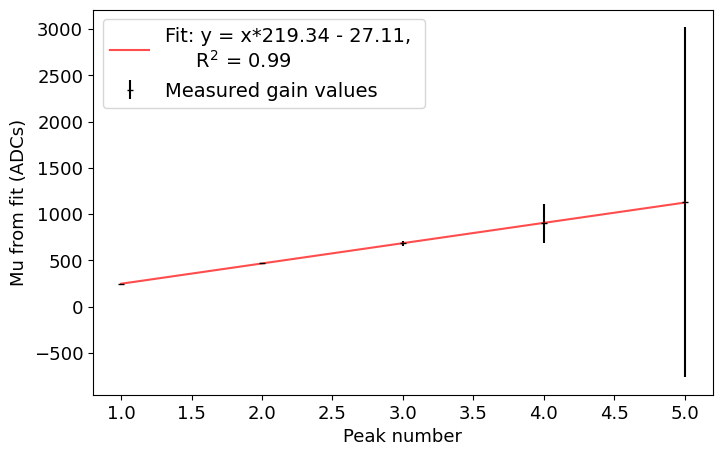

In [31]:
sel_channel = 8

all_slopes8 = {}
for sel_date in peak_heigh_all_channels_dict.keys():
    try:
        all_slopes8[sel_date] = fit_spectrum_and_plot(peak_heigh_all_channels_dict[sel_date][sel_channel], channel=sel_channel, initial_guess=initial_guess8)
    except RuntimeError:
        continue

### Channel 4

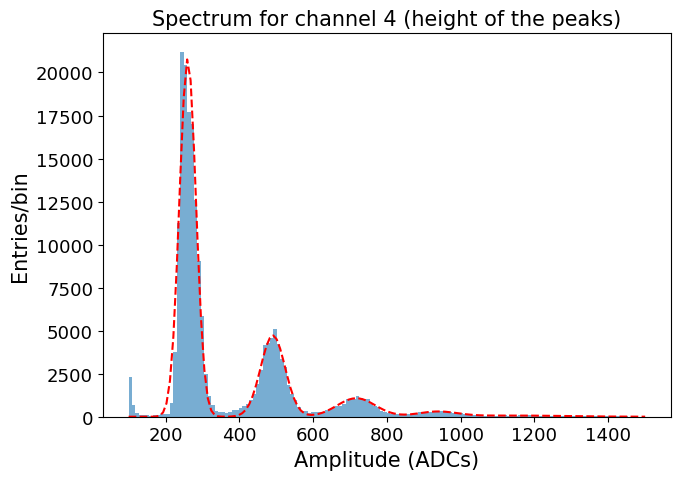

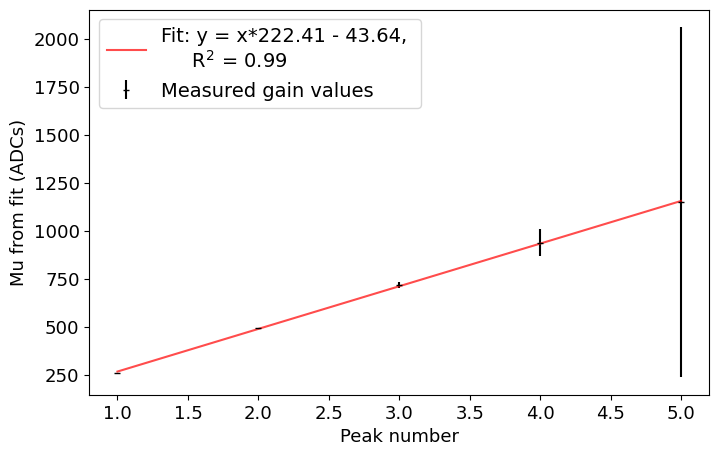

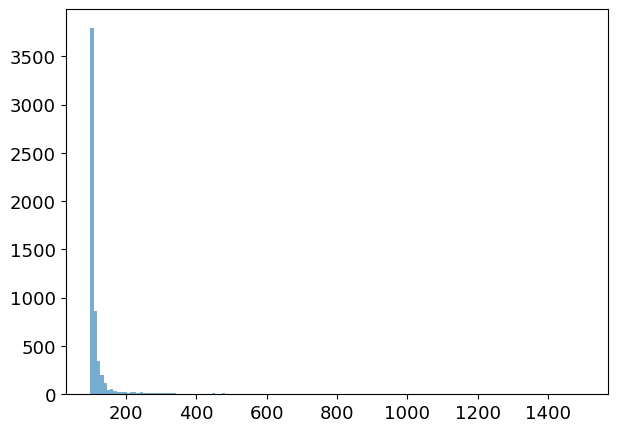

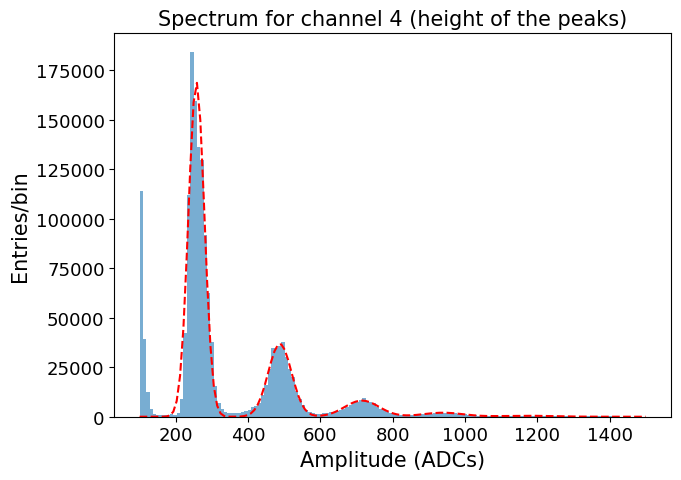

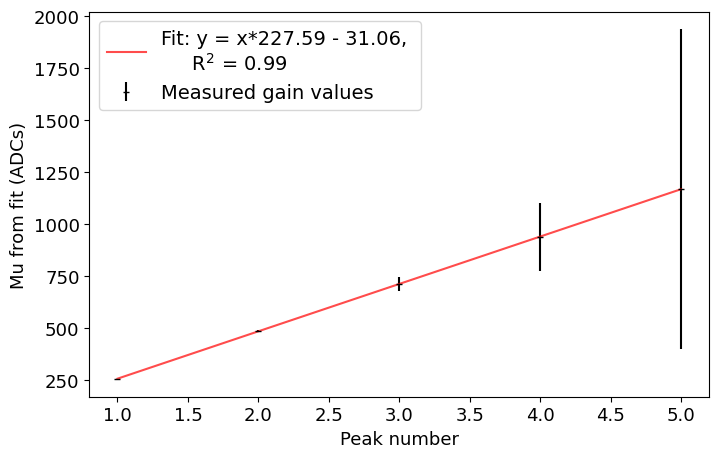

...

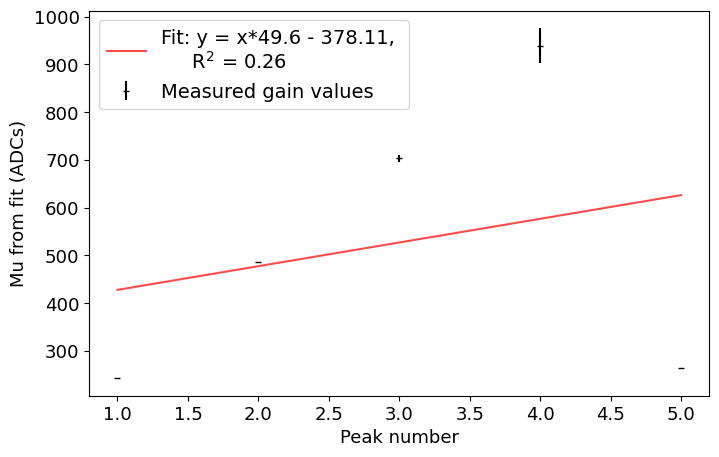

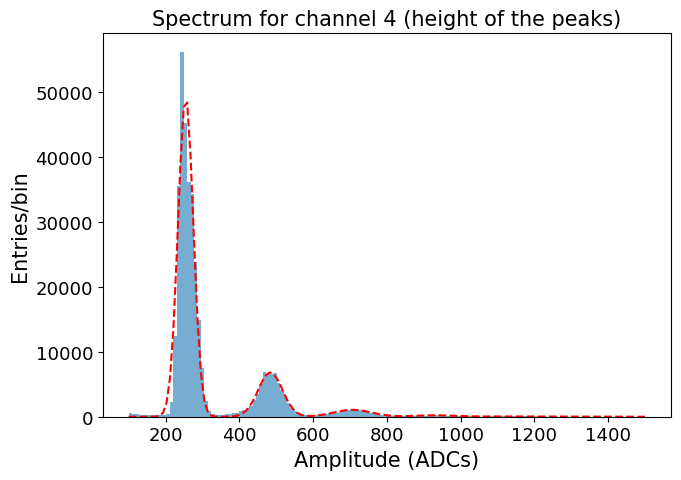

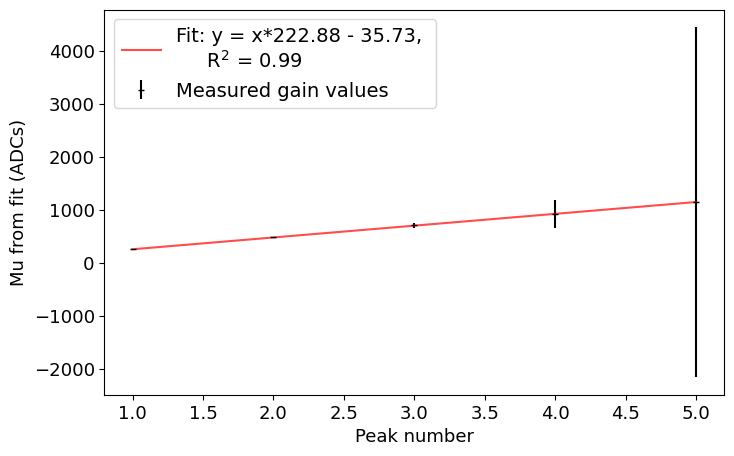

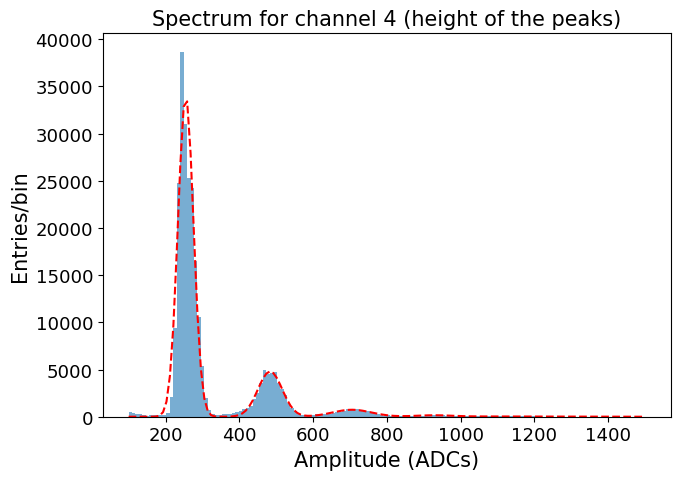

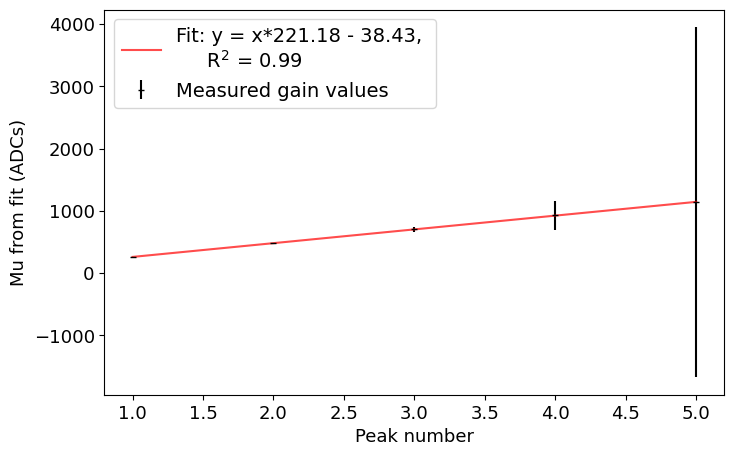

In [33]:
sel_channel = 4

all_slopes4 = {}
for sel_date in peak_heigh_all_channels_dict.keys():
    try:
        all_slopes4[sel_date] = fit_spectrum_and_plot(peak_heigh_all_channels_dict[sel_date][sel_channel], channel=sel_channel, initial_guess=initial_guess4)
    except RuntimeError:
        continue

### Channel 0

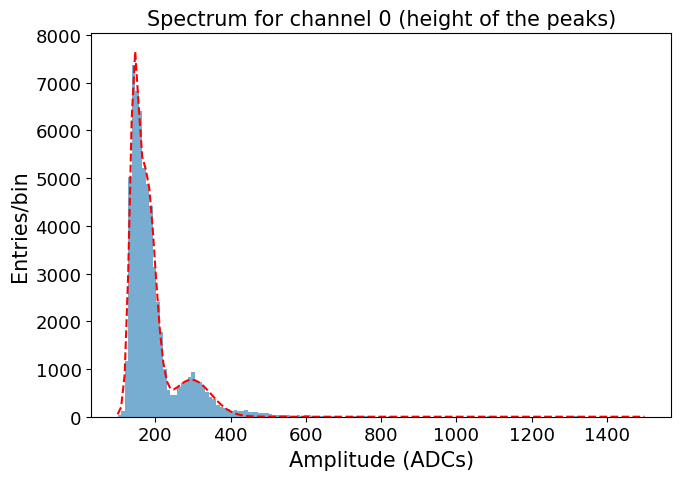

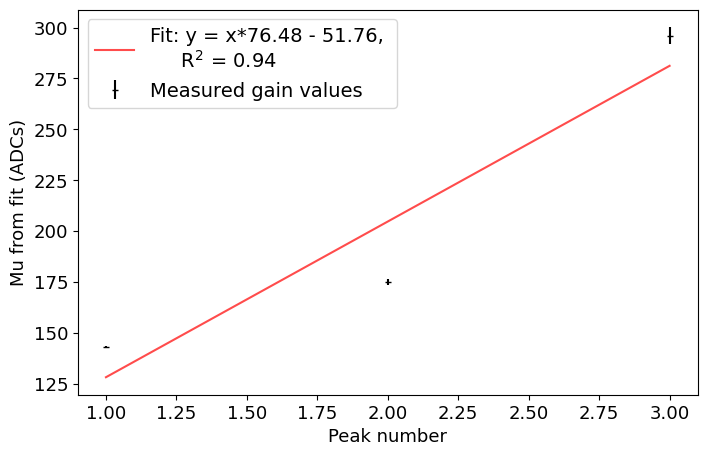

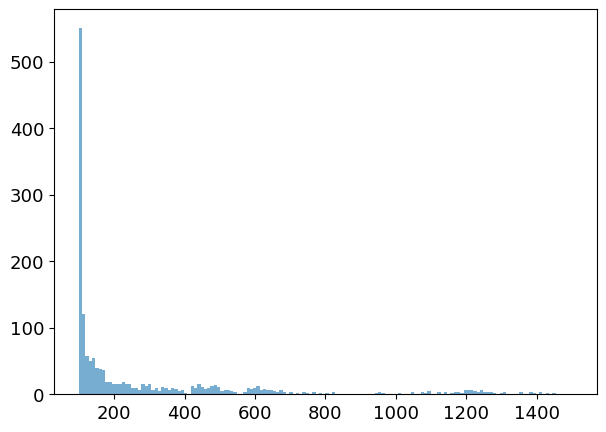

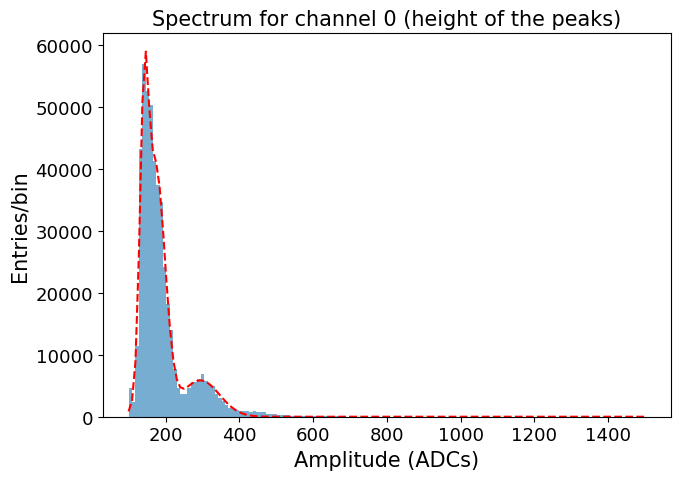

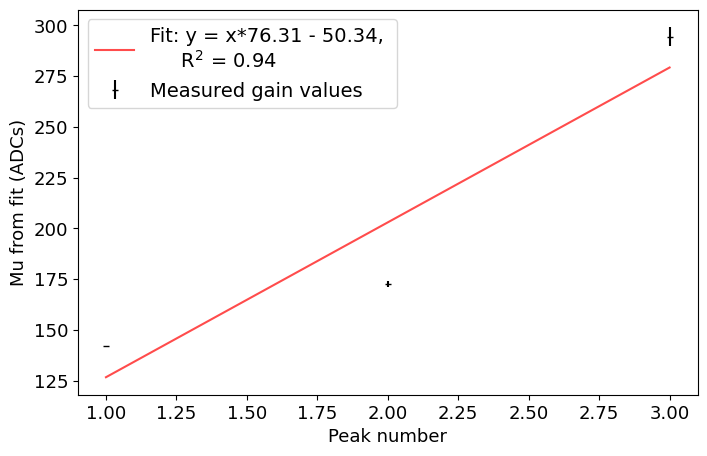

...

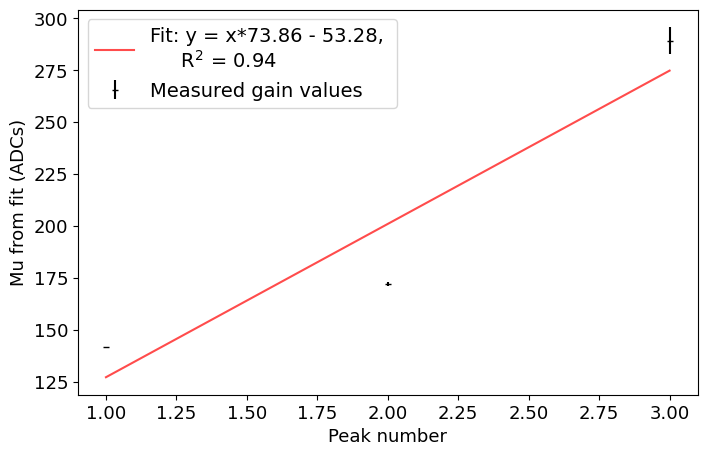

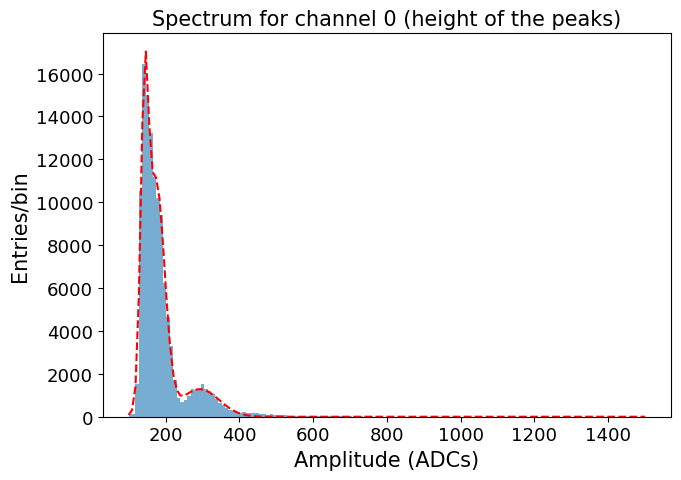

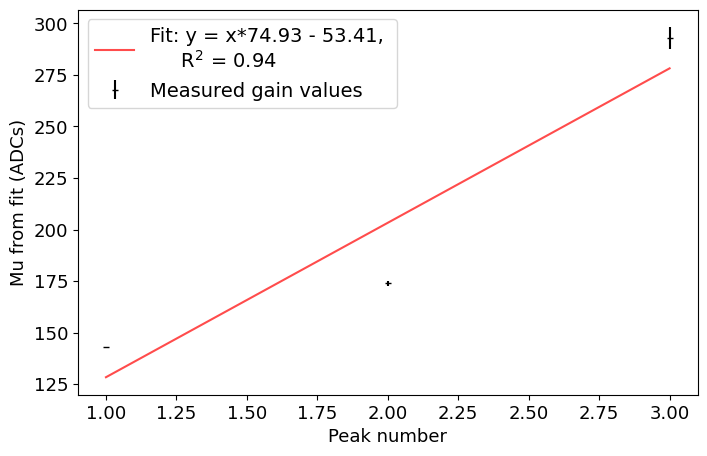

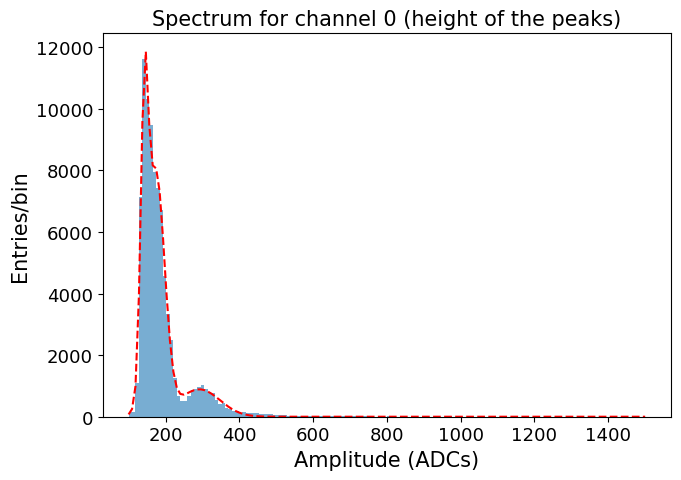

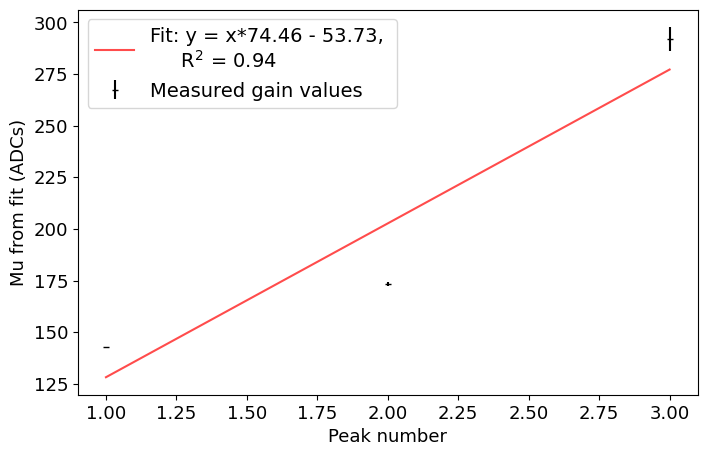

In [37]:
sel_channel = 0

all_slopes0 = {}
for sel_date in peak_heigh_all_channels_dict.keys():
    try:
        all_slopes0[sel_date] = fit_spectrum_and_plot(peak_heigh_all_channels_dict[sel_date][sel_channel], channel=sel_channel, initial_guess=initial_guess0)
    except RuntimeError:
        continue

### Channel 1

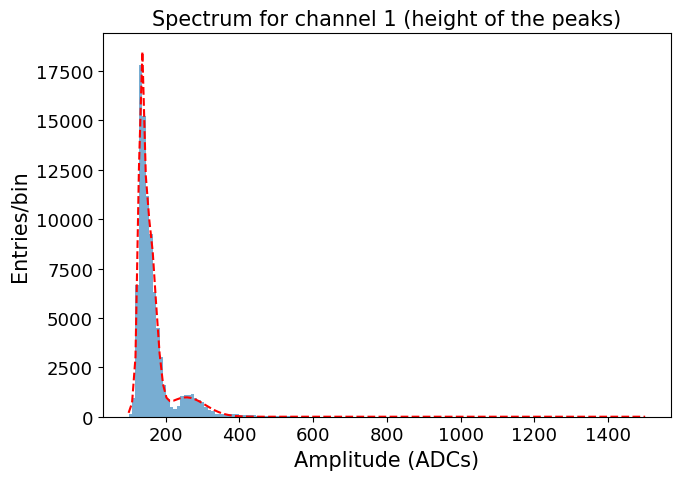

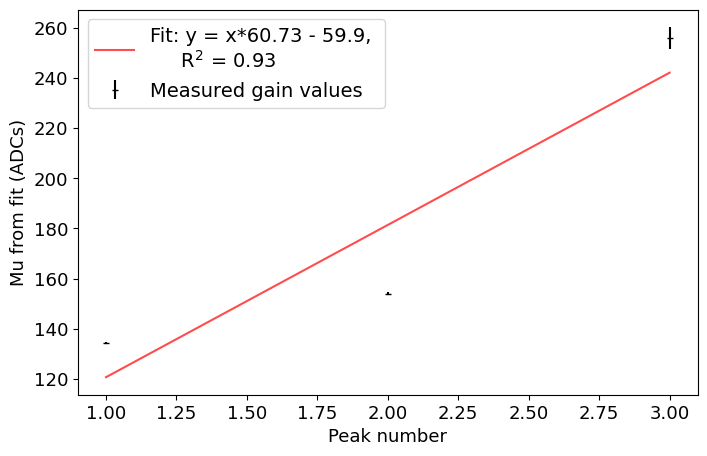

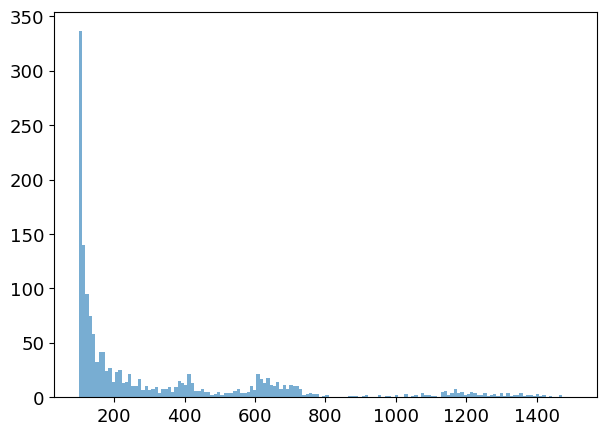

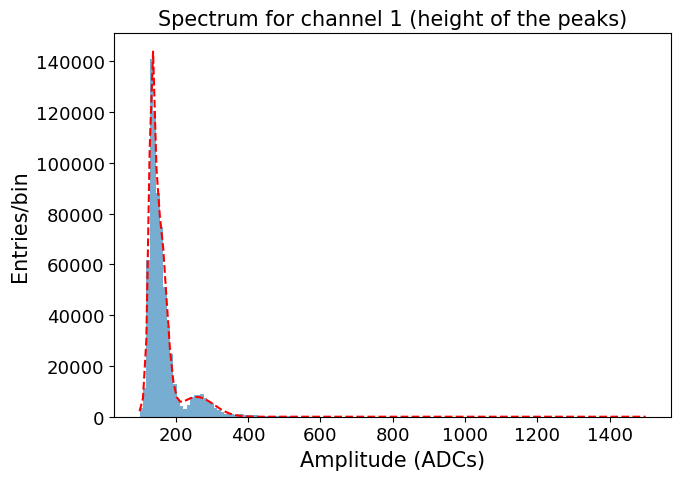

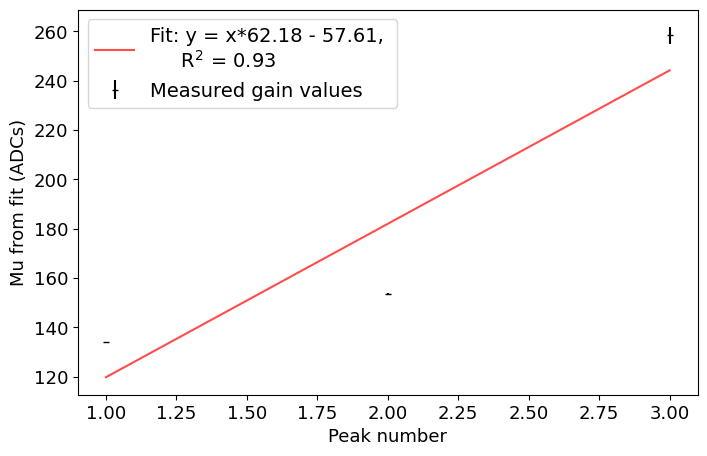

...

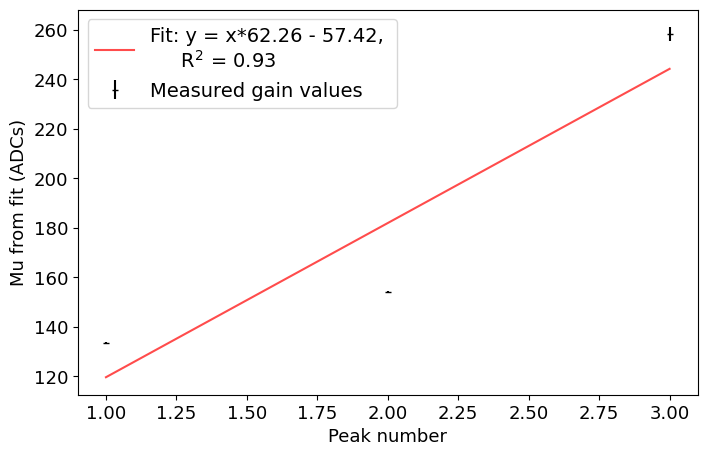

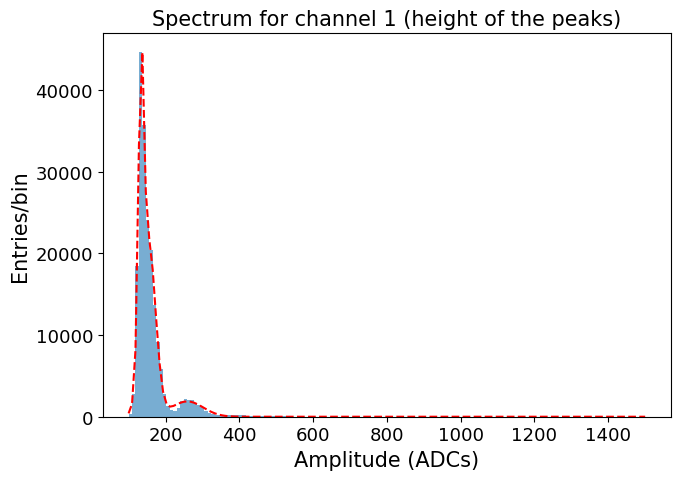

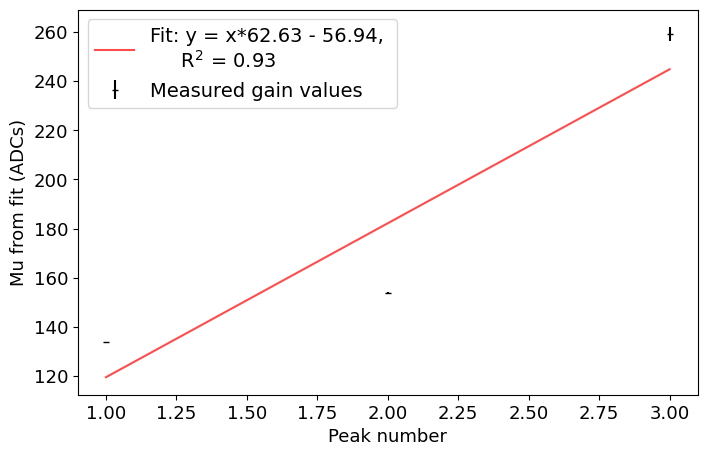

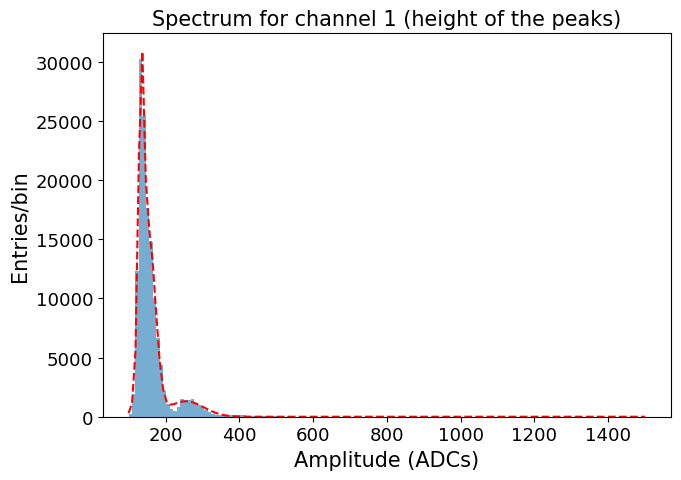

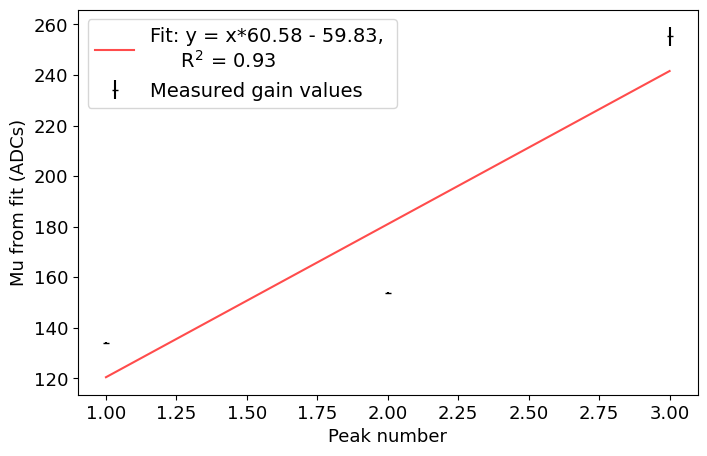

In [36]:
sel_channel = 1

all_slopes1 = {}
for sel_date in peak_heigh_all_channels_dict.keys():
    try:
        all_slopes1[sel_date] = fit_spectrum_and_plot(peak_heigh_all_channels_dict[sel_date][sel_channel], channel=sel_channel, initial_guess=initial_guess1)
    except RuntimeError:
        continue

### Channel 2

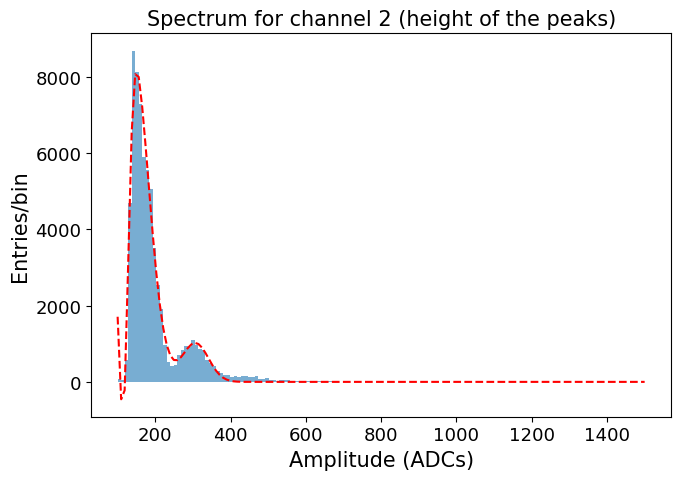

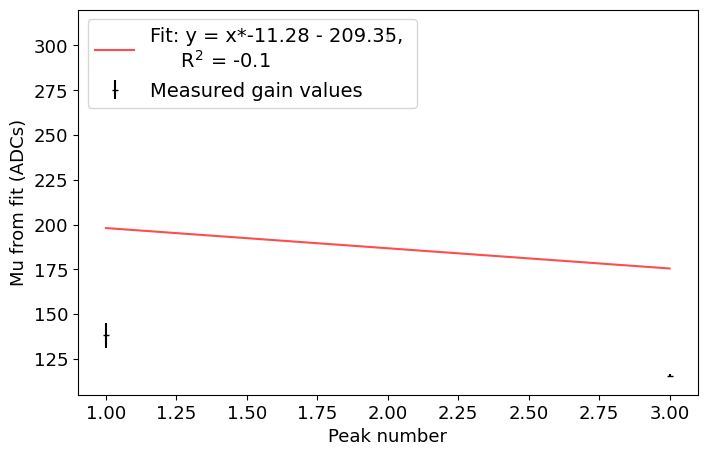

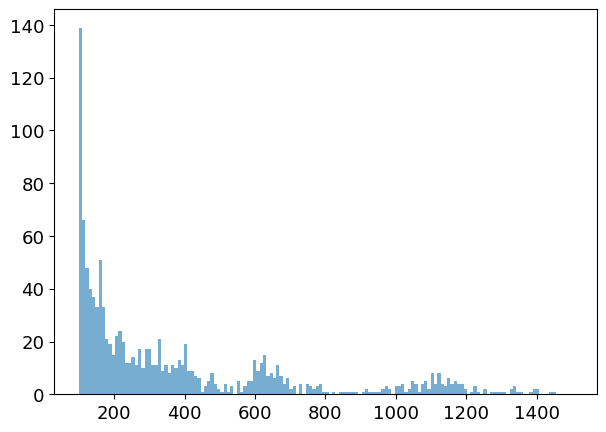

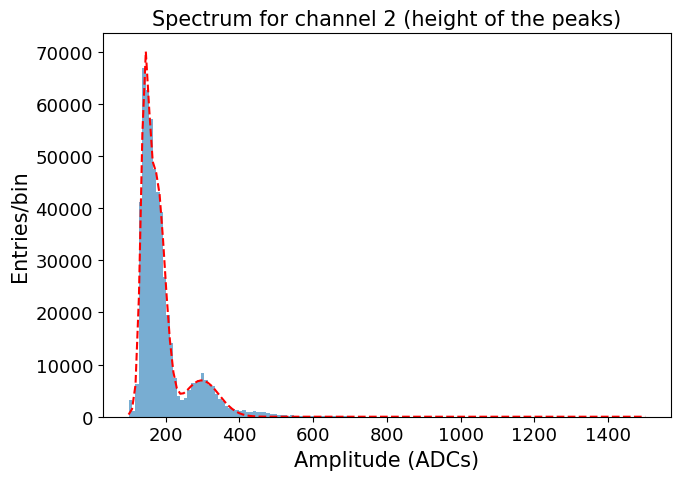

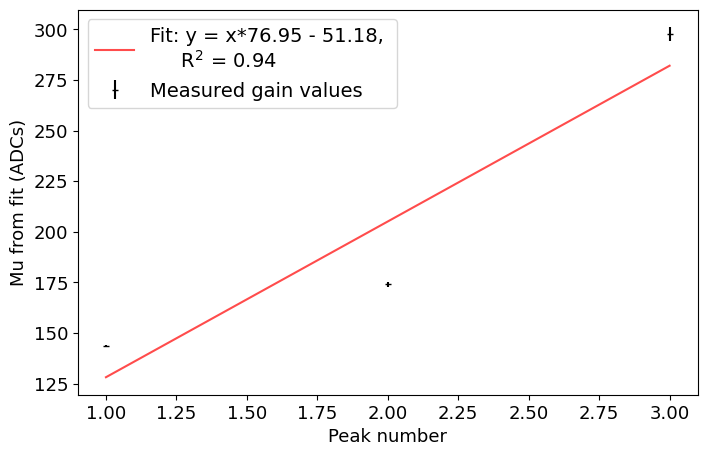

...

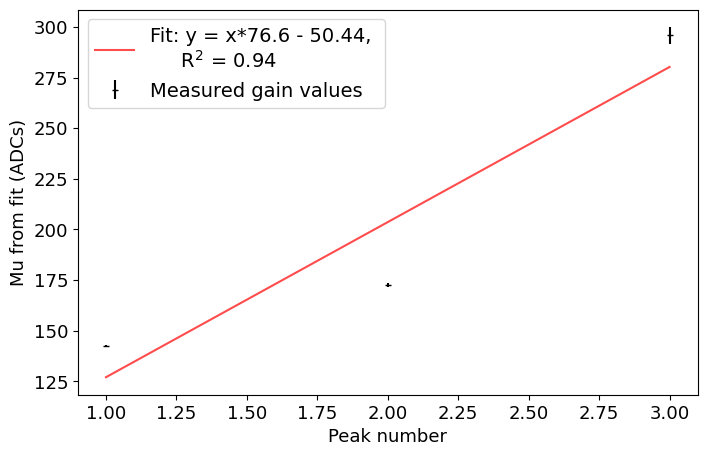

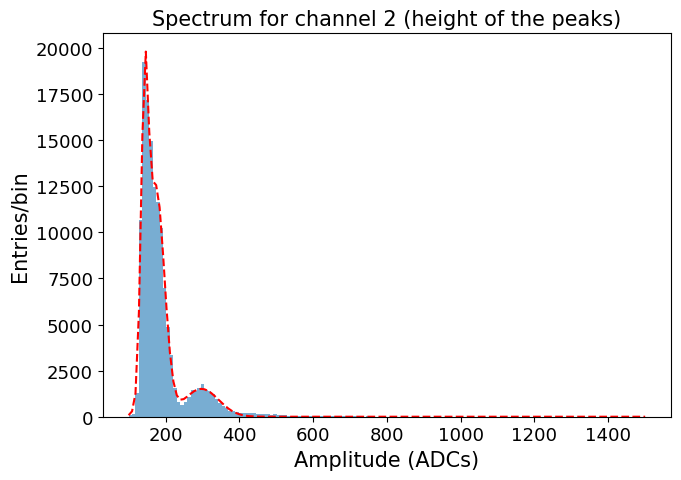

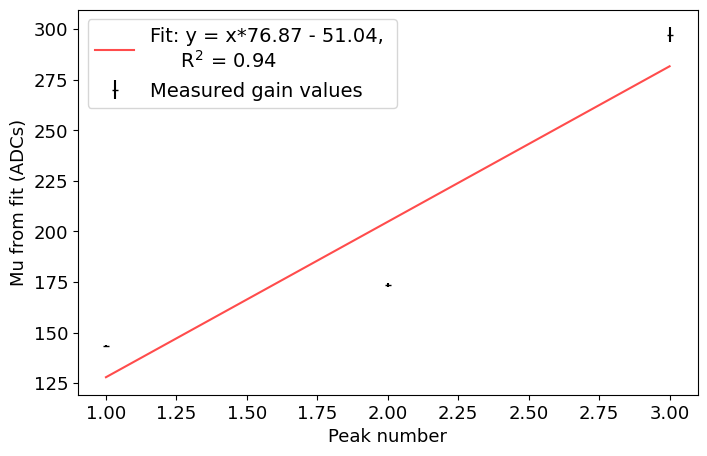

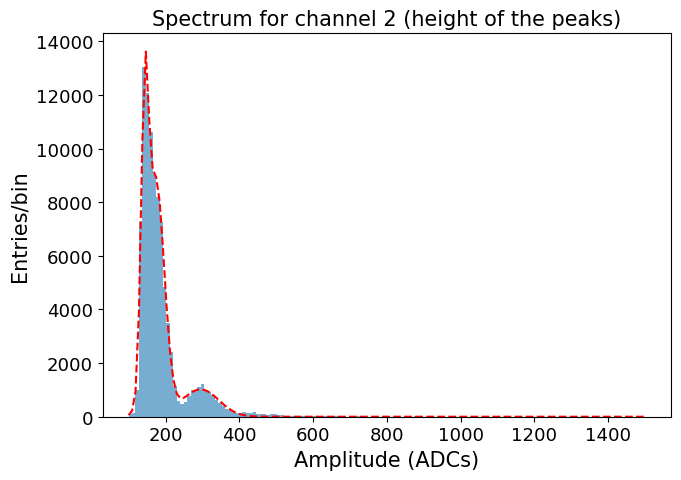

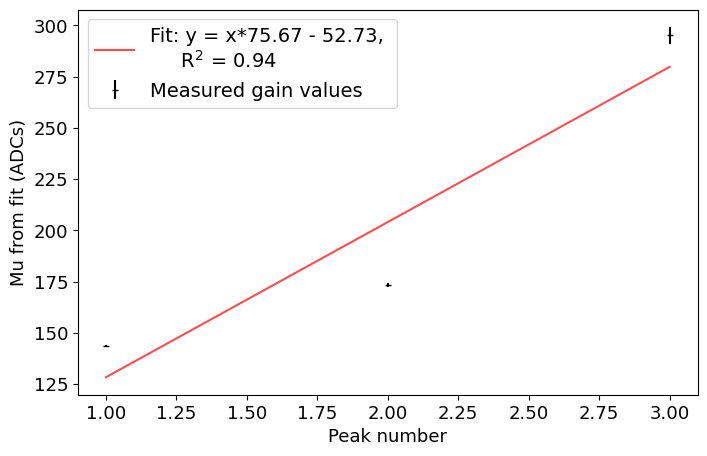

In [38]:
sel_channel = 2

all_slopes2 = {}
for sel_date in peak_heigh_all_channels_dict.keys():
    try:
        all_slopes2[sel_date] = fit_spectrum_and_plot(peak_heigh_all_channels_dict[sel_date][sel_channel], channel=sel_channel, initial_guess=initial_guess2)
    except RuntimeError:
        continue

### Channel 5

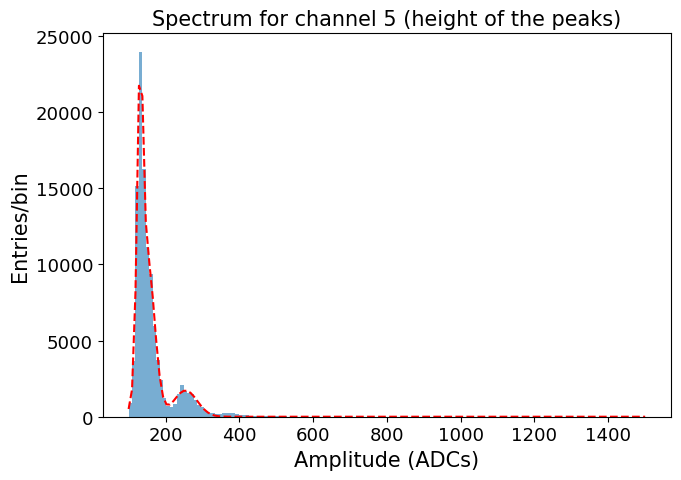

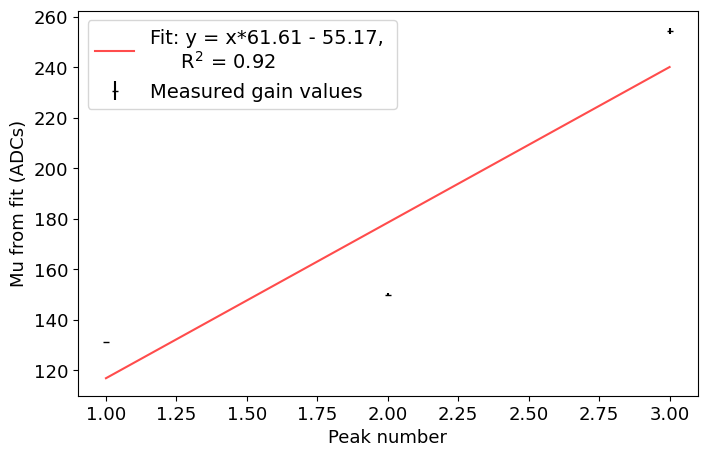

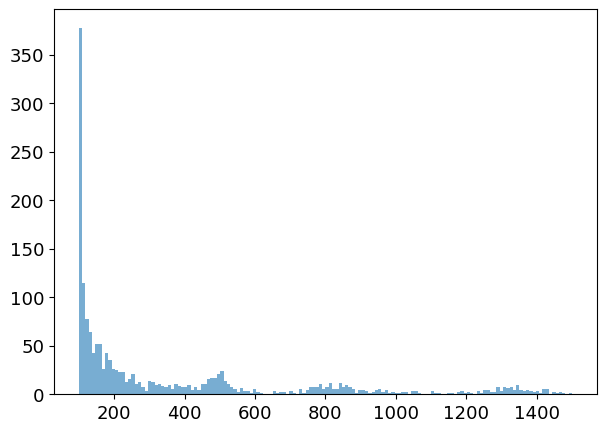

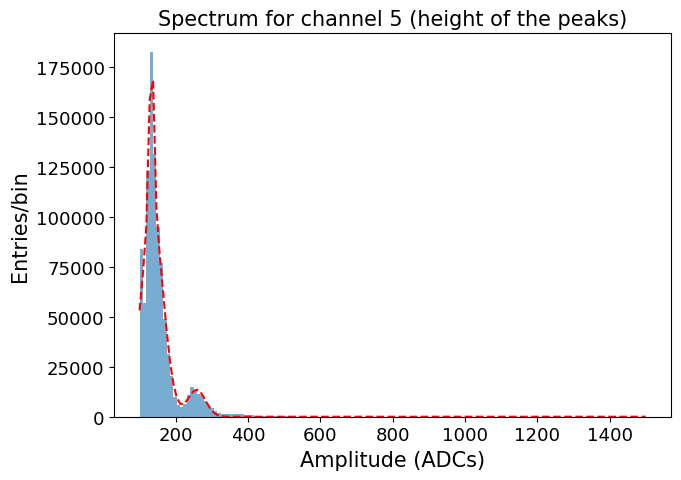

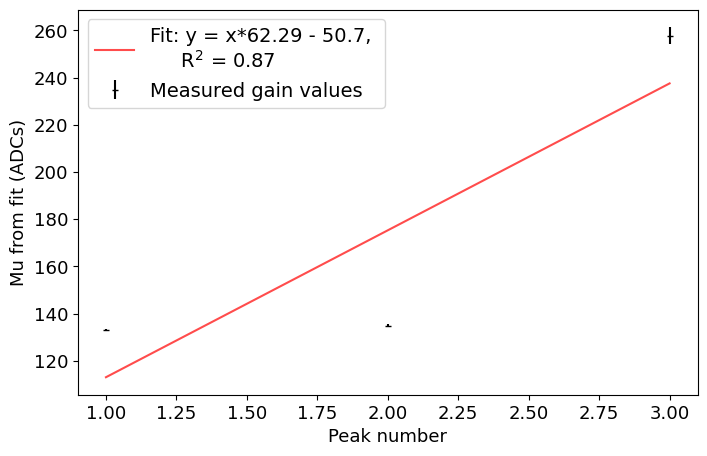

...

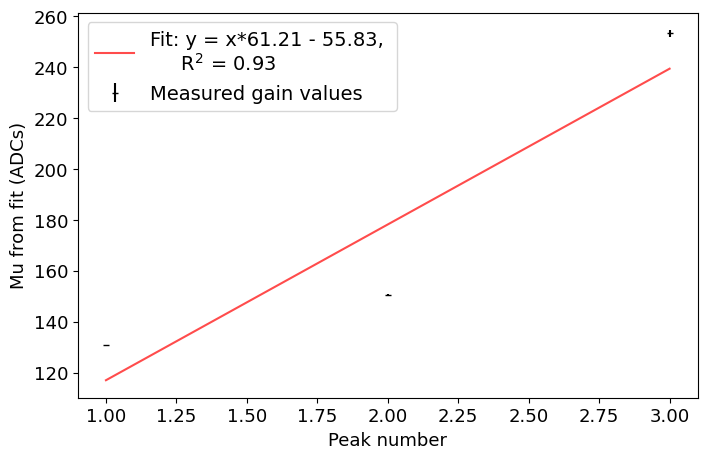

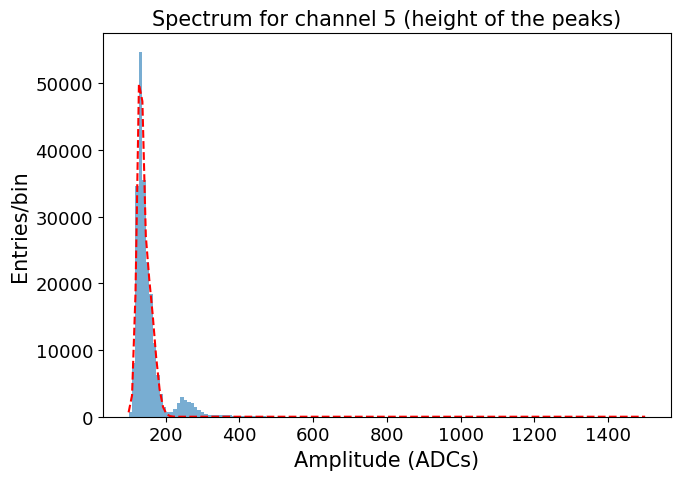

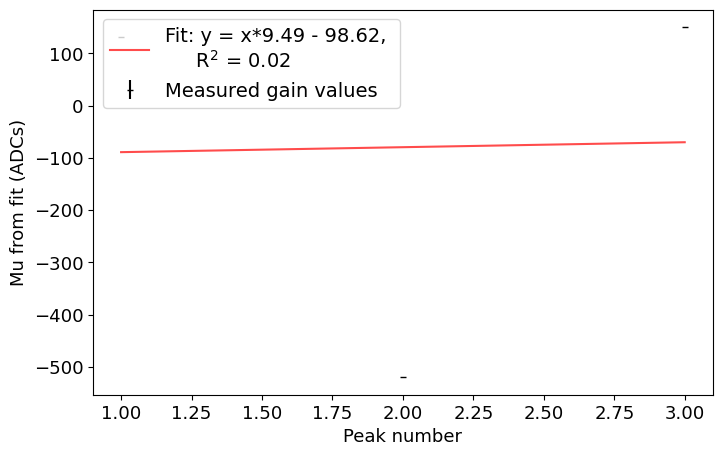

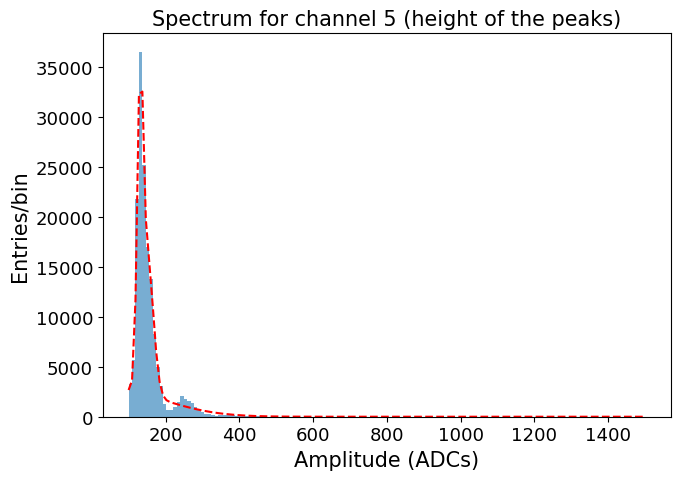

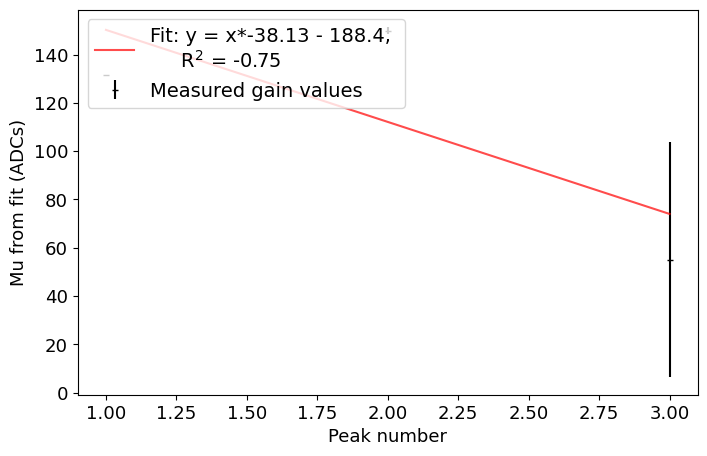

In [40]:
sel_channel = 5

all_slopes5 = {}
for sel_date in peak_heigh_all_channels_dict.keys():
    try:
        all_slopes5[sel_date] = fit_spectrum_and_plot(peak_heigh_all_channels_dict[sel_date][sel_channel], channel=sel_channel, initial_guess=initial_guess5)
    except RuntimeError:
        continue

### Channel 6

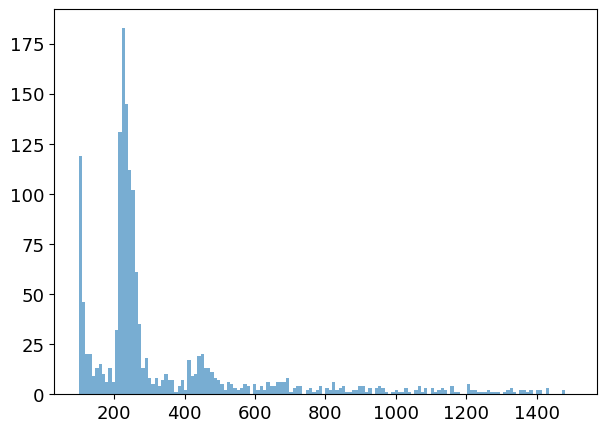

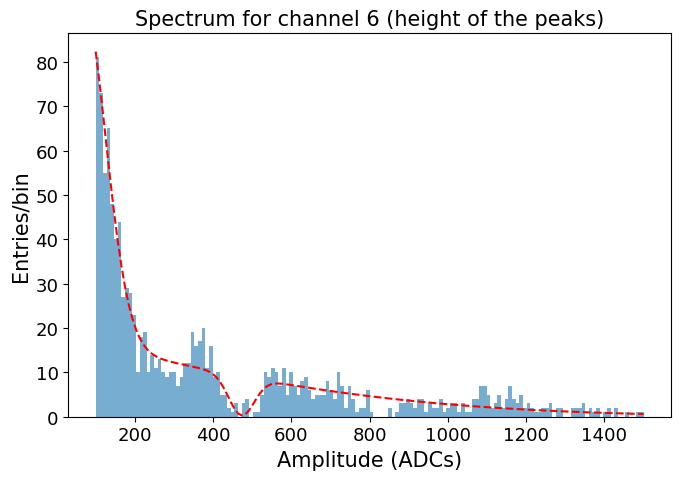

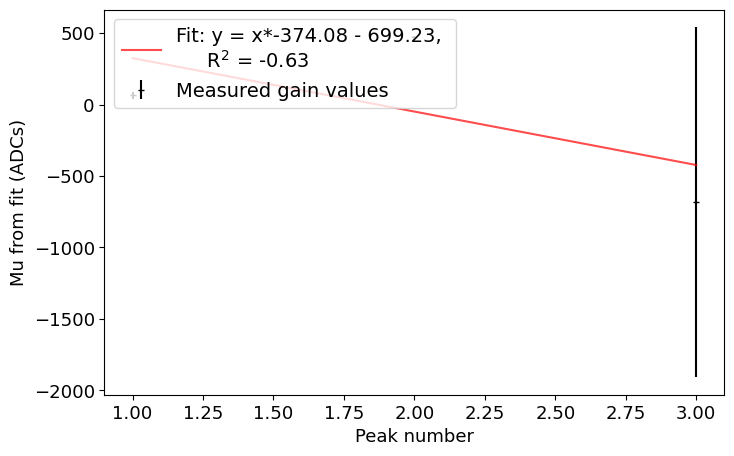

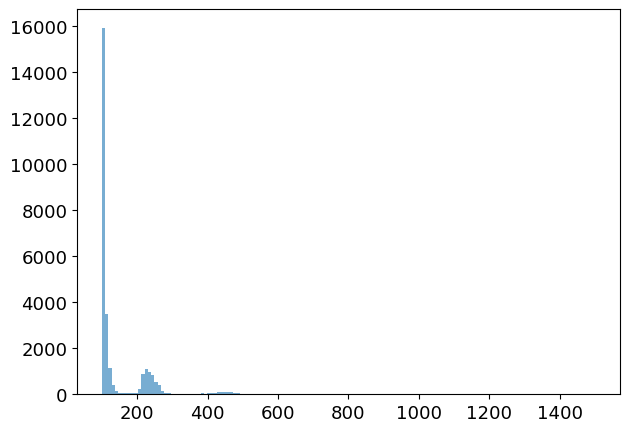

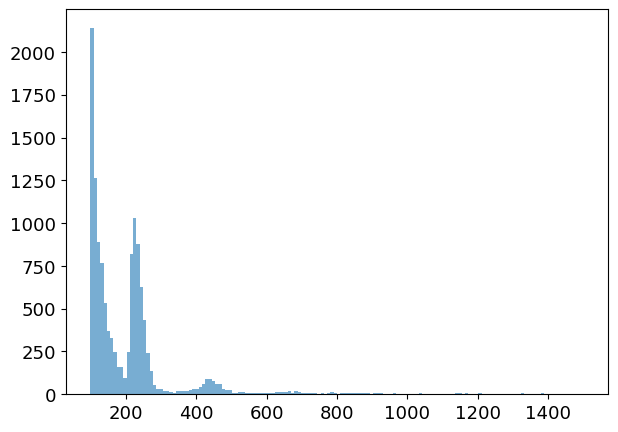

...

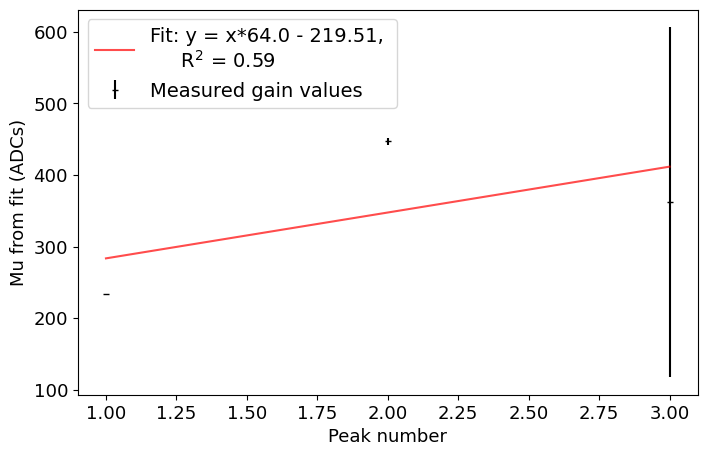

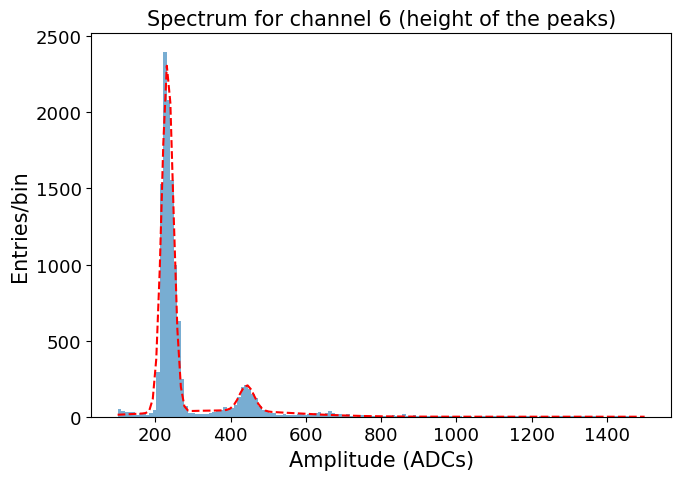

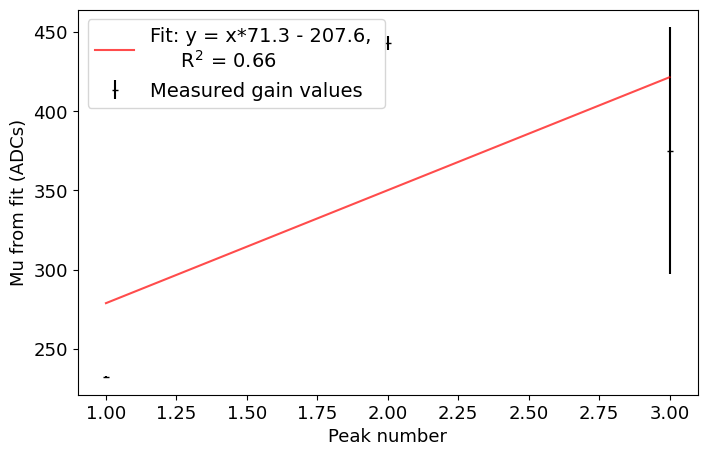

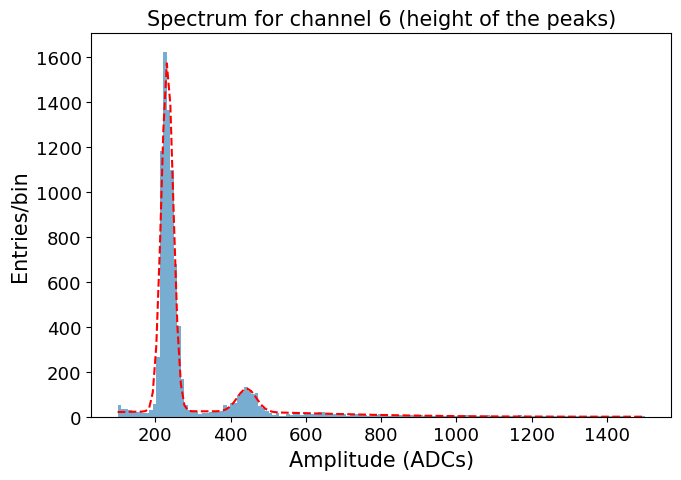

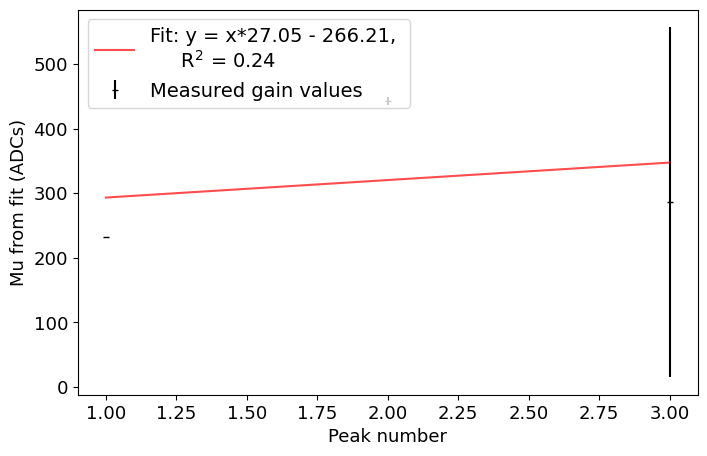

In [41]:
sel_channel = 6

all_slopes6 = {}
for sel_date in peak_heigh_all_channels_dict.keys():
    try:
        all_slopes6[sel_date] = fit_spectrum_and_plot(peak_heigh_all_channels_dict[sel_date][sel_channel], channel=sel_channel, initial_guess=initial_guess6)
    except RuntimeError:
        continue

## All channels

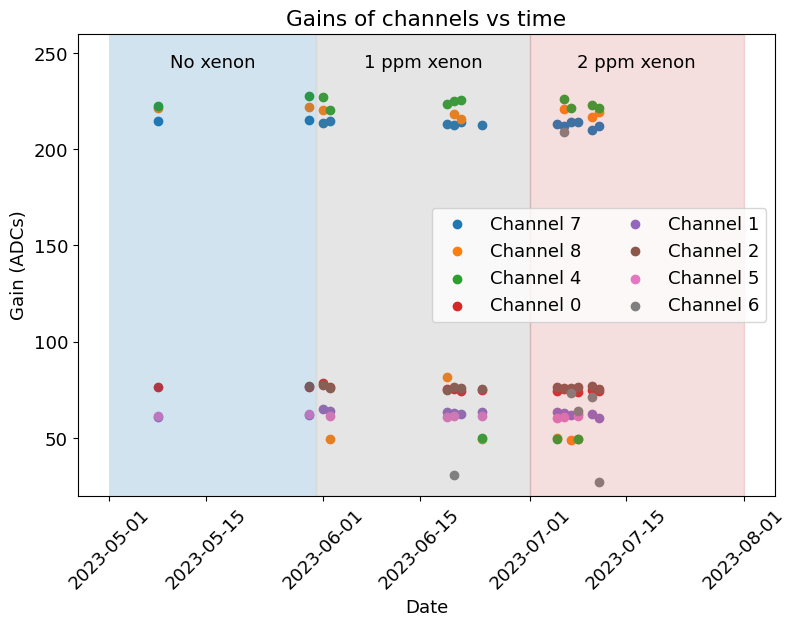

In [42]:
dates = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes.keys()]
plt.scatter(dates, all_slopes .values(), label='Channel 7')

dates8 = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes8.keys()]
plt.scatter(dates8, all_slopes8.values(), label='Channel 8')

dates4 = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes4.keys()]
plt.scatter(dates4, all_slopes4.values(), label='Channel 4')

dates0 = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes0.keys()]
plt.scatter(dates0, all_slopes0.values(), label='Channel 0')

dates1 = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes1.keys()]
plt.scatter(dates1, all_slopes1.values(), label='Channel 1')

dates2 = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes2.keys()]
plt.scatter(dates2, all_slopes2.values(), label='Channel 2')

dates5 = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes5.keys()]
plt.scatter(dates5, all_slopes5.values(), label='Channel 5')

dates6 = [datetime.strptime(date, '%m_%d_%Y') for date in all_slopes6.keys()]
plt.scatter(dates6, all_slopes6.values(), label='Channel 6')

no_xenon_dates   = datetime(2023, 5, 1),  datetime(2023, 5, 31)
xenon_1ppm_dates = datetime(2023, 5, 31), datetime(2023, 7, 1)
xenon_2ppm_dates = datetime(2023, 7, 1),  datetime(2023, 8, 1)

plt.axvspan(no_xenon_dates  [0], no_xenon_dates  [1], alpha=0.2)
plt.axvspan(xenon_1ppm_dates[0], xenon_1ppm_dates[1], alpha=0.2, color='grey')
plt.axvspan(xenon_2ppm_dates[0], xenon_2ppm_dates[1], alpha=0.2, color='indianred')

diff1_mid = no_xenon_dates  [0] + (no_xenon_dates  [1] - no_xenon_dates  [0]) / 2
diff2_mid = xenon_1ppm_dates[0] + (xenon_1ppm_dates[1] - xenon_1ppm_dates[0]) / 2
diff3_mid = xenon_2ppm_dates[0] + (xenon_2ppm_dates[1] - xenon_2ppm_dates[0]) / 2

plt.text(diff1_mid, 245, 'No xenon', ha='center', va='center')
plt.text(diff2_mid, 245, '1 ppm xenon', ha='center', va='center')
plt.text(diff3_mid, 245, '2 ppm xenon', ha='center', va='center')

plt.xlabel('Date')
plt.ylabel('Gain (ADCs)')
plt.title('Gains of channels vs time')
plt.xticks(rotation=45)  # Optional: Rotate x-axis labels for better visibility
plt.ylim(20, 260)
plt.legend(ncol=2, loc='center right')
plt.show()
